In [1]:
#import cip # library that has the packet structure of minicps network data
#from scapy.all import *
from nwk_feature_engineering import NwkFeaturer
from sklearn.preprocessing import OneHotEncoder
import matplotlib.pyplot as plt
#import wntr
#import wntr.network.controls as controls
import csv
import time
import pandas as pd
import numpy as np
from datetime import datetime
import glob
import numpy as np

import seaborn as sns
# import tikzplotlib

from scipy.spatial.distance import euclidean
# from fastdtw import fastdtw
import scipy.stats as stats

from matplotlib.colors import ListedColormap
from matplotlib.patches import Rectangle

In [2]:
def plot_attacks_with_nwk(series, variable_names, legends, titles, pandas_list, a_label, figure_title, subplots_titles,
                          sub_filename='do_subplot', y_label='water level in tank (m)', 
                          xlim=[0,2880], ylim=None, markers=None, leg_poc='lower left', sub_sample=2):

    ticks = np.arange(xlim[0], xlim[1], step=288)
    ticks_labels = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat','Sun', 'Mon', 'Tue', 'Wed' ]
       
    font = {'weight' : 'normal',
            'size'   : 18}
    plt.rc('font', **font)        
    sns.set_palette(sns.color_palette("colorblind"))
        
    # Builds subplot grid
    fig = plt.figure(figsize = (27,20), dpi=80, constrained_layout=True)
    subfigs = fig.subfigures(2, 1,  hspace=0.03, wspace=0.01)
 
    subplot_n_columns = 1
    subplot_n_rows = len(variable_names)

    axes = subfigs[0].subplots(subplot_n_rows,subplot_n_columns, squeeze=False, sharex=False)
  
    subplot_row = 0
    subplot_column = 0    
    i = 0    
    sub_sample = 2
    for variable in variable_names:
        j = 0
        for serie in series:
            if j == 0:
                axes[subplot_row][subplot_column].plot(serie[variable], label=legends[j], linewidth=2.0)
            else:
                axes[subplot_row][subplot_column].plot(serie[variable], label=legends[j], marker=markers[j-1], linestyle='None', markevery=sub_sample, markersize=6)
            j = j + 1             
        if i== subplot_n_rows-1:
            axes[subplot_row][subplot_column].legend(loc=leg_poc)
            
        axes[subplot_row][subplot_column].grid(True)
        axes[subplot_row][subplot_column].set_title(titles[i])
        axes[subplot_row][subplot_column].set_ylabel(y_label) 
        
        axes[subplot_row][subplot_column].set_xticks(ticks)
        axes[subplot_row][subplot_column].set_xticklabels(ticks_labels)
    
        if xlim:
            axes[subplot_row][subplot_column].set_xlim(left=xlim[0], right=xlim[1])                            
        if ylim:
            axes[subplot_row][subplot_column].set_ylim(bottom=ylim[0], top=ylim[1])                            
            
        attack_begin_line = 1812
        attack_end_line = 1440
        axes[subplot_row][subplot_column].axvspan(attack_begin_line, attack_end_line, facecolor='gray', alpha=.2)
            
        subplot_column = subplot_column + 1
        if subplot_column >= subplot_n_columns:
            subplot_column = 0
            subplot_row = subplot_row + 1
        i = i +1
    
    
    axs_nwk = subfigs[1].subplots(1,len(pandas_list), sharex=True)
    
    subplot_index = 0
    if len(pandas_list) > 1:
        for dataframe in pandas_list:
            this_panda = pandas_list[subplot_index]
            this_panda = this_panda[this_panda.Command != 'GET T1']
            this_panda = this_panda[this_panda.Command != 'GET T2']
            this_panda = this_panda[this_panda.Command != 'GET T3']
            this_panda = this_panda[this_panda.Command != 'GET T4']
            this_panda = this_panda[this_panda.Command != 'GET PU1']
            this_panda = this_panda[this_panda.Command != 'GET PU2']
            this_panda = this_panda[this_panda.Command != 'GET PU3']
            this_panda = this_panda[this_panda.Command != 'GET PU4']
            this_panda = this_panda[this_panda.Command != 'GET PU7F']
            this_panda = this_panda[this_panda.Command != 'GET PU3F']
            this_panda = this_panda[this_panda.Command != 'GET PU4F']
            this_panda = this_panda[this_panda.Command != 'GET PU7']
            this_panda = this_panda[this_panda.Command != 'GET PU6']
            this_panda = this_panda[this_panda.Command != 'GET PU5']
            this_panda = this_panda[this_panda.Command != 'GET PU1F']
            this_panda = this_panda[this_panda.Command != 'GET PU2F']
            this_panda = this_panda[this_panda.Command != 'GET PU5F']
            this_panda = this_panda[this_panda.Command != 'GET PU6F']
            this_panda = this_panda[this_panda.Command != 'GET J256']
            this_panda = this_panda[this_panda.Command != 'GET J14']
            this_panda = this_panda[this_panda.Command != 'GET J415']
            this_panda = this_panda[this_panda.Command != 'GET J289']
            this_panda = this_panda[this_panda.Command != 'GET J269']
            this_panda = this_panda[this_panda.Command != 'GET J280']
            this_panda = this_panda[this_panda.Command != 'GET J300']
            this_panda = this_panda[this_panda.Command != 'GET J422']
            this_panda = this_panda[this_panda.Command != 'GET V2']
            this_panda = this_panda[this_panda.Command != 'GET V2F']
            this_panda = this_panda[this_panda.Command != 'ARP Req']
            this_panda = this_panda[this_panda.Command != 'ARP Res']
            this_panda = this_panda[this_panda.Command != 'A']
            this_panda = this_panda[this_panda.Command != 'FA']
            sns.histplot(this_panda[a_label], label=a_label, ax=axs_nwk[subplot_index],stat='percent')
            axs_nwk[subplot_index].grid(True)

            axs_nwk[subplot_index].set_title(subplots_titles[subplot_index])
            subfigs[1].suptitle(figure_title)

            subplot_index = subplot_index + 1
    elif len(pandas_list) == 0:
            this_panda = pandas_list[subplot_index]
            this_panda = this_panda[this_panda.Command != 'GET T1']
            this_panda = this_panda[this_panda.Command != 'GET T2']
            this_panda = this_panda[this_panda.Command != 'GET T3']
            this_panda = this_panda[this_panda.Command != 'GET T4']
            this_panda = this_panda[this_panda.Command != 'GET PU1']
            this_panda = this_panda[this_panda.Command != 'GET PU2']
            this_panda = this_panda[this_panda.Command != 'GET PU3']
            this_panda = this_panda[this_panda.Command != 'GET PU4']
            this_panda = this_panda[this_panda.Command != 'GET PU7F']
            this_panda = this_panda[this_panda.Command != 'GET PU3F']
            this_panda = this_panda[this_panda.Command != 'GET PU4F']
            this_panda = this_panda[this_panda.Command != 'GET PU7']
            this_panda = this_panda[this_panda.Command != 'GET PU6']
            this_panda = this_panda[this_panda.Command != 'GET PU5']
            this_panda = this_panda[this_panda.Command != 'GET PU1F']
            this_panda = this_panda[this_panda.Command != 'GET PU2F']
            this_panda = this_panda[this_panda.Command != 'GET PU5F']
            this_panda = this_panda[this_panda.Command != 'GET PU6F']
            this_panda = this_panda[this_panda.Command != 'GET J256']
            this_panda = this_panda[this_panda.Command != 'GET J280']
            this_panda = this_panda[this_panda.Command != 'GET J14']
            this_panda = this_panda[this_panda.Command != 'GET J415']
            this_panda = this_panda[this_panda.Command != 'GET J289']
            this_panda = this_panda[this_panda.Command != 'GET J269']
            this_panda = this_panda[this_panda.Command != 'GET J300']
            this_panda = this_panda[this_panda.Command != 'GET J422']
            this_panda = this_panda[this_panda.Command != 'GET V2']
            this_panda = this_panda[this_panda.Command != 'GET V2F']
            this_panda = this_panda[this_panda.Command != 'ARP Req']
            this_panda = this_panda[this_panda.Command != 'ARP Res']
            this_panda = this_panda[this_panda.Command != 'A']
            this_panda = this_panda[this_panda.Command != 'FA']
            sns.histplot(this_panda[a_label], label=a_label, ax=axs_nwk, stat='percent')
            axs_nwk.grid(True)

            axs_nwk.set_title(subplots_titles[subplot_index])
            subfigs[1].suptitle(figure_title)

            subplot_index = subplot_index + 1
            
    
    plt.savefig(sub_filename+'.png', orientation='landscape', bbox_inches='tight')
    plt.savefig(sub_filename+'.pdf', orientation='landscape', bbox_inches='tight')  

In [4]:
def plot_with_envelope(series, variable_names, legends, titles, envelope_min, envelope_max, sub_filename='do_subplot', y_label='water level in tank (m)', 
                 xlim=[0,2880], ylim=None, markers=None, sub_sample=2):
    
    subplot_n_columns = 1
    subplot_n_rows = len(variable_names)
    
    ticks = np.arange(xlim[0], xlim[1], step=288)    
    time = np.arange(xlim[0], xlim[1])    
    ticks_labels = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat','Sun', 'Mon', 'Tue', 'Wed' ]
       
    font = {'weight' : 'normal',
            'size'   : 18}
    plt.rc('font', **font)        
    sns.set_palette(sns.color_palette("colorblind"))
        
    # Builds subplot grid
    f, axes = plt.subplots(subplot_n_rows,subplot_n_columns, figsize = (27,20), 
                           squeeze=False, dpi=80, sharex=False)
        
    subplot_row = 0
    subplot_column = 0    
    i = 0    
    sub_sample = 2
    for variable in variable_names:
        j = 0
        for serie in series:
            if j == 0:
                axes[subplot_row][subplot_column].plot(serie[variable], label=legends[j], linewidth=2.0)
            else:
                axes[subplot_row][subplot_column].plot(serie[variable], label=legends[j], marker=markers[j-1], linestyle='None', markevery=sub_sample, markersize=6)
            j = j + 1             
        if i== subplot_n_rows-1:
            axes[subplot_row][subplot_column].legend(loc='lower right')
            
        axes[subplot_row][subplot_column].grid(True)
        axes[subplot_row][subplot_column].set_title(titles[i])
        axes[subplot_row][subplot_column].set_ylabel(y_label)  
        axes[subplot_row][subplot_column].set_xticks(ticks)
        axes[subplot_row][subplot_column].set_xticklabels(ticks_labels)
        axes[subplot_row][subplot_column].fill_between(time, envelope_min[i][xlim[0]:xlim[1]], envelope_max[i][xlim[0]:xlim[1]],
                                                       alpha=0.2, color='gray')
        
        if xlim:
            axes[subplot_row][subplot_column].set_xlim(left=xlim[0], right=xlim[1])                            
   
        subplot_column = subplot_column + 1
        if subplot_column >= subplot_n_columns:
            subplot_column = 0
            subplot_row = subplot_row + 1
  
        i = i +1
            
    plt.savefig(sub_filename+'.png', orientation='landscape', bbox_inches='tight')
    plt.savefig(sub_filename+'.pdf', orientation='landscape', bbox_inches='tight')      
        

def plot_attacks(series, variable_names, legends, titles, sub_filename='do_subplot', y_label='water level in tank (m)', 
                 xlim=[0,2880], ylim=None, markers=None, leg_poc='lower left',sub_sample=2, 
                 attack_begin_line=1812, attack_end_line=1440, dim1=27, dim2=20):
    
    subplot_n_columns = 1
    subplot_n_rows = len(variable_names)
    
    use_labels = False
    
    if xlim[-1] == 2880:
        use_labels = True
    
    if use_labels:
        ticks = np.arange(xlim[0], xlim[1], step=288)    
        ticks_labels = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat','Sun', 'Mon', 'Tue', 'Wed' ]
       
    font = {'weight' : 'normal',
            'size'   : 18}
    plt.rc('font', **font)        
    sns.set_palette(sns.color_palette("colorblind"))
        
    # Builds subplot grid
    
    if len(variable_names)<=1:    
        f, axes = plt.subplots(subplot_n_rows,subplot_n_columns, figsize = (16,10), 
                               squeeze=False, dpi=80, sharex=True)
    else:    
        f, axes = plt.subplots(subplot_n_rows,subplot_n_columns, figsize = (dim1,dim2), 
                               squeeze=False, dpi=80, sharex=True)
    
        
    subplot_row = 0
    subplot_column = 0    
    i = 0    
    sub_sample = 2
    for variable in variable_names:
        j = 0
        for serie in series:
            if j == 0:
                axes[subplot_row][subplot_column].plot(serie[variable], label=legends[j], linewidth=2.0)
            else:
                axes[subplot_row][subplot_column].plot(serie[variable], label=legends[j], marker=markers[j-1], linestyle='None', markevery=sub_sample, markersize=6)
            j = j + 1             
        if i== subplot_n_rows-1:
            axes[subplot_row][subplot_column].legend(bbox_to_anchor=(0.5, -0.50), loc='center', ncol=2)

        
            
        axes[subplot_row][subplot_column].grid(True)
        axes[subplot_row][subplot_column].set_title(titles[i])
        axes[subplot_row][subplot_column].set_ylabel(y_label[i])  
        
        
    
        if xlim:
            axes[subplot_row][subplot_column].set_xlim(left=xlim[0], right=xlim[1])                            
        if ylim:
            axes[subplot_row][subplot_column].set_ylim(bottom=ylim[0], top=ylim[1])                            
            

        try:
            axes[subplot_row][subplot_column].axvspan(attack_begin_line, attack_end_line, facecolor='gray', alpha=.2)
        except:
            axes[subplot_row][subplot_column].axvspan(attack_begin_line[0], attack_end_line[0], facecolor='gray', alpha=.4)
            axes[subplot_row][subplot_column].axvspan(attack_begin_line[1], attack_end_line[1], facecolor='red', alpha=.2)
        subplot_column = subplot_column + 1
        if subplot_column >= subplot_n_columns:
            subplot_column = 0
            subplot_row = subplot_row + 1

  
        i = i +1

    print(plt.xticks() ) # Get the current locations and labels.

    labels = np.round(np.array([ 0,  288, 576, 864, 1152, 1440, 1728, 2016, 2304, 2592,2880])*[5]/1440,2)
        
    plt.xticks([ 0,  288, 576, 864, 1152, 1440, 1728, 2016, 2304, 2592,2880], labels)
    plt.xlabel('Time [days]') 
            
    plt.savefig(sub_filename+'.pdf', orientation='landscape', bbox_inches='tight')  

In [5]:
def extract_packets_by_period(phy, nwk, adjust_timezone, interval=[0, 2880]): 
    low_limit  =  (datetime.strptime(phy.iloc[interval[0]]['timestamp'], "%Y-%m-%d %H:%M:%S.%f")-datetime(1970, 1, 1)).total_seconds()
    high_limit =  (datetime.strptime(phy.iloc[interval[1]]['timestamp'], "%Y-%m-%d %H:%M:%S.%f")-datetime(1970, 1, 1)).total_seconds()
    
    if adjust_timezone:
        nwk['Timestamp'] = nwk['Timestamp'] + 28800  
    exp = (nwk['Timestamp'] >= low_limit) & (nwk['Timestamp'] <= high_limit)
    return nwk.loc[exp,:]

def number_packets_by_period(phy, nwk, period, command=None, interval=[0, 2880]):    
    low_limit  =  (datetime.strptime(phy.iloc[interval[0]]['timestamp'], "%Y-%m-%d %H:%M:%S.%f")-datetime(1970, 1, 1)).total_seconds()
    high_limit =  (datetime.strptime(phy.iloc[interval[1]]['timestamp'], "%Y-%m-%d %H:%M:%S.%f")-datetime(1970, 1, 1)).total_seconds()
    
    # phy timestamps is in string-datetime format 
    time_as_epochs = pd.to_datetime(phy['timestamp']).astype('int64')//1e9
    time_as_epochs = time_as_epochs.iloc[interval[0]:interval[1]+1]
    
    # now hour times is in epoch
    hour_times = time_as_epochs.iloc[::period]
    period_packets = []
    
    if command=='RST':
        exp = (nwk['Command'] == 'R')
        nwk = nwk[exp]
        
    elif command=='ARP':
        exp = (nwk['Protocol'] == 'ARP')
        nwk = nwk[exp]     
            
    elif command=='SA':
        exp = (nwk['Command'] == 'SA')
        nwk = nwk[exp]     
        
    
    if nwk.empty:
        for i in range(1,len(hour_times)):       
            period_packets.append(0)            
    else:         
        for i in range(1,len(hour_times)):
            this_hour = len(nwk[(nwk['Timestamp'] >= hour_times.iloc[i-1]) & (nwk['Timestamp'] <= hour_times.iloc[i]) ])
            period_packets.append(this_hour)                
    return period_packets

def get_period_command_list(phy, nwk, interval, adjust=True):
    command_list = ['S', 'REG', 'GET T42',  'GET T41', 'GET P78', 'GET P79'] 
    period_command_list = []
    period_pkts = extract_packets_by_period(phy, nwk, adjust, interval)
    for command in command_list:
        exp = (period_pkts['Command'] == command) 
        period_command_list.append(period_pkts.loc[exp, 'Command Time'])
        
    return period_command_list


In [6]:
def get_median_nwk_loss_and_delay(delay_path, loss_path, output_path='nwk_conditions.csv'):
    median_delay = pd.read_csv(delay_path).median(axis=1)
    median_loss = pd.read_csv(loss_path).median(axis=1)
    aux_df = pd.concat([median_delay, median_loss],axis=1)
    nwk_df.columns = ['Packet Loss', 'Network Delay']
    new_df.to_csv(output_path)
    
def prepare_pandas(df1, df2):
    if 'timestamp' in df1.columns:
        aux1 = df1.drop('timestamp', axis=1).astype(float)
    else:
        aux1 = df1

    if 'timestamp' in df2.columns:        
        aux2 = df2.drop('timestamp', axis=1).astype(float)    
    else:
        aux2 = df2
    return aux1, aux2

def get_abs_deviation(df1, df2):
    return get_diff_pandas(df1,df2).abs()

def get_diff_pandas(df1, df2):
    df1, df2 = prepare_pandas(df1, df2)    
    return df1.sub(df2, axis='index')

def get_tanks_deviations(wntr_path, dhalsim_paths, nwk_conditions_path, min_value=0, max_value=2017):
    nwk_conditions = pd.read_csv(nwk_conditions_path)    
    nwk_runs = []
    wntr_runs = []
    deviations_from_normal = []

    tank_columns = ['T1_LEVEL', 'T2_LEVEL', 'T3_LEVEL', 'T4_LEVEL', 'T5_LEVEL', 'T6_LEVEL', 'T7_LEVEL']
    
    # Total deviations of each tank
    deviations = []
    
    wntr_index = 0
    for path in dhalsim_paths:        
        file_path = path + '/ground_truth.csv'    
        nwk_runs.append(pd.read_csv(file_path)[tank_columns])    
        wntr_runs.append(pd.read_csv(wntr_paths[wntr_index])[tank_columns])

        this_run_dev = []
        for tank in tank_columns:
            this_run_dev.append(get_abs_deviation(wntr_runs[-1], nwk_runs[-1]).iloc[min_value:max_value][tank].median())
        
        deviations.append(this_run_dev)
        
        wntr_index = wntr_index + 1 

        
    tank_df = pd.DataFrame(deviations, columns=tank_columns)        
        
    return tank_df
        
def generate_tanks_heatmap(t_df):       
    
    tanks_heatmaps = []
    tuples = list(zip(nwk_conditions['Packet Loss'], nwk_conditions['Network Delay']))
    df_index = pd.MultiIndex.from_tuples(tuples, names=['Packet Loss', 'Network Delay'])    
    
    for column in t_df:            
        tuples = list(zip(nwk_conditions['Packet Loss'], nwk_conditions['Network Delay']))
        df_index = pd.MultiIndex.from_tuples(tuples, names=['Packet Loss', 'Network Delay'])            
        tank_df = pd.DataFrame(t_df[column].values, index=df_index, columns=['Average Deviation'])
        tanks_heatmaps.append(tank_df.reset_index().pivot(columns='Packet Loss',index='Network Delay',values='Average Deviation'))
    
    return tanks_heatmaps

def plot_heatmap(heatmap_list, labels, titles, filename):
    font = {'weight' : 'normal',
            'size'   : 18}
    plt.rc('font', **font)        
    sns.set_palette(sns.color_palette("colorblind"))
    
    f, axes = plt.subplots(len(heatmap_list),1, figsize = (27,30), squeeze=False, dpi=80, sharex=False)
    
    heatmap_plots = []
    subplot_index = 0
    for df in heatmap_list:        
        heatmap_plots.append(sns.heatmap(df, 
                                         ax=axes[subplot_index][0],
                                         cmap="Blues", 
                                         cbar_kws={'label': labels[subplot_index]},
                                         annot=False))
        heatmap_plots[-1].invert_yaxis()
        heatmap_plots[-1].set_title(titles[subplot_index])
        heatmap_plots[-1].set_xlabel('Tank Level')
        heatmap_plots[-1].set_ylabel('Week Simulation')
        subplot_index = subplot_index + 1        
        
    #plt.savefig(filename + '.png', orientation='landscape', bbox_inches='tight')
    plt.savefig(filename + '.pdf', orientation='landscape', bbox_inches='tight') 

In [7]:
preamble_folder = '../dataset/evasion_data/'
attack_1_no_concealment  = pd.read_csv(preamble_folder+'attack_output_38/ground_truth.csv')
attack_1_2_no_concealment  = pd.read_csv(preamble_folder+'attack_output_45/ground_truth.csv')
attack_3_no_concealment  = pd.read_csv(preamble_folder+'attack_output_39/ground_truth.csv')
attack_4_no_concealment  = pd.read_csv(preamble_folder+'attack_output_40/ground_truth.csv')
attack_9_no_concealment  = pd.read_csv(preamble_folder+'attack_output_41/ground_truth.csv')
attack_12_no_concealment = pd.read_csv(preamble_folder+'attack_output_42/ground_truth.csv')
attack_14_no_concealment = pd.read_csv(preamble_folder+'attack_output_43/ground_truth.csv')
attack_14_2_no_concealment = pd.read_csv(preamble_folder+'attack_output_46/ground_truth.csv')

attack_1_no_concealment_scada  = pd.read_csv(preamble_folder+'attack_output_38/scada_values.csv')
attack_1_2_no_concealment_scada  = pd.read_csv(preamble_folder+'attack_output_45/scada_values.csv')
attack_3_no_concealment_scada  = pd.read_csv(preamble_folder+'attack_output_39/scada_values.csv')
attack_4_no_concealment_scada  = pd.read_csv(preamble_folder+'attack_output_40/scada_values.csv')
attack_9_no_concealment_scada  = pd.read_csv(preamble_folder+'attack_output_41/scada_values.csv')
attack_12_no_concealment_scada = pd.read_csv(preamble_folder+'attack_output_42/scada_values.csv')
attack_14_no_concealment_scada = pd.read_csv(preamble_folder+'attack_output_43/scada_values.csv')
attack_14_2_no_concealment_scada = pd.read_csv(preamble_folder+'attack_output_46/scada_values.csv')


In [9]:
normal_conditions = pd.read_csv('../dataset/normal_operating_conditions_one_week/output_01/ground_truth.csv')
normal_conditions_scada = pd.read_csv('../dataset/normal_operating_conditions_one_week/output_01/scada_values.csv')

attack_01 = pd.read_csv(preamble_folder+'attack_output_01/ground_truth.csv')
attack_01_scada = pd.read_csv(preamble_folder+'attack_output_01/scada_values.csv')

attack_02 = pd.read_csv(preamble_folder+'attack_output_02/ground_truth.csv')
attack_02_scada = pd.read_csv(preamble_folder+'attack_output_02/scada_values.csv')

attack_44 = pd.read_csv(preamble_folder+'attack_output_44/ground_truth.csv')
attack_44_scada = pd.read_csv(preamble_folder+'attack_output_44/scada_values.csv')

attack_03 = pd.read_csv(preamble_folder+'attack_output_03/ground_truth.csv')
attack_03_scada = pd.read_csv(preamble_folder+'attack_output_03/scada_values.csv')

attack_04 = pd.read_csv(preamble_folder+'attack_output_04/ground_truth.csv')
attack_04_scada = pd.read_csv(preamble_folder+'attack_output_04/scada_values.csv')

attack_05 = pd.read_csv(preamble_folder+'attack_output_05/ground_truth.csv')
attack_05_scada = pd.read_csv(preamble_folder+'attack_output_05/scada_values.csv')

attack_06 = pd.read_csv(preamble_folder+'attack_output_06/ground_truth.csv')
attack_06_scada = pd.read_csv(preamble_folder+'attack_output_06/scada_values.csv')

attack_07 = pd.read_csv(preamble_folder+'attack_output_07/ground_truth.csv')
attack_07_scada = pd.read_csv(preamble_folder+'attack_output_07/scada_values.csv')

attack_08 = pd.read_csv(preamble_folder+'attack_output_08/ground_truth.csv')
attack_08_scada = pd.read_csv(preamble_folder+'attack_output_08/scada_values.csv')

attack_09 = pd.read_csv(preamble_folder+'attack_output_09/ground_truth.csv')
attack_09_scada = pd.read_csv(preamble_folder+'attack_output_09/scada_values.csv')

attack_10 = pd.read_csv(preamble_folder+'attack_output_10/ground_truth.csv')
attack_10_scada = pd.read_csv(preamble_folder+'attack_output_10/scada_values.csv')

attack_11 = pd.read_csv(preamble_folder+'attack_output_11/ground_truth.csv')
attack_11_scada = pd.read_csv(preamble_folder+'attack_output_11/scada_values.csv')

attack_12 = pd.read_csv(preamble_folder+'attack_output_12/ground_truth.csv')
attack_12_scada = pd.read_csv(preamble_folder+'attack_output_12/scada_values.csv')

attack_13 = pd.read_csv(preamble_folder+'attack_output_13/ground_truth.csv')
attack_13_scada = pd.read_csv(preamble_folder+'attack_output_13/scada_values.csv')

attack_14 = pd.read_csv(preamble_folder+'attack_output_14/ground_truth.csv')
attack_14_scada = pd.read_csv(preamble_folder+'attack_output_14/scada_values.csv')

attack_15 = pd.read_csv(preamble_folder+'attack_output_15/ground_truth.csv')
attack_15_scada = pd.read_csv(preamble_folder+'attack_output_15/scada_values.csv')

attack_25 = pd.read_csv(preamble_folder+'attack_output_25/ground_truth.csv')
attack_25_scada = pd.read_csv(preamble_folder+'attack_output_25/scada_values.csv')

attack_26 = pd.read_csv(preamble_folder+'attack_output_26/ground_truth.csv')
attack_26_scada = pd.read_csv(preamble_folder+'attack_output_26/scada_values.csv')

attack_27 = pd.read_csv(preamble_folder+'attack_output_27/ground_truth.csv')
attack_27_scada = pd.read_csv(preamble_folder+'attack_output_27/scada_values.csv')

attack_28 = pd.read_csv(preamble_folder+'attack_output_28/ground_truth.csv')
attack_28_scada = pd.read_csv(preamble_folder+'attack_output_28/scada_values.csv')

attack_29 = pd.read_csv(preamble_folder+'attack_output_29/ground_truth.csv')
attack_29_scada = pd.read_csv(preamble_folder+'attack_output_29/scada_values.csv')

attack_34 = pd.read_csv(preamble_folder+'attack_output_34/ground_truth.csv')
attack_34_scada = pd.read_csv(preamble_folder+'attack_output_34/scada_values.csv')

attack_35 = pd.read_csv(preamble_folder+'attack_output_35/ground_truth.csv')
attack_35_scada = pd.read_csv(preamble_folder+'attack_output_35/scada_values.csv')

attack_36 = pd.read_csv(preamble_folder+'attack_output_36/ground_truth.csv')
attack_36_scada = pd.read_csv(preamble_folder+'attack_output_36/scada_values.csv')

attack_37 = pd.read_csv(preamble_folder+'attack_output_37/ground_truth.csv')
attack_37_scada = pd.read_csv(preamble_folder+'attack_output_37/scada_values.csv')



In [10]:
run_markers = ['1', '2', '3', '4', '+', 'x']

# Anomalies 1 vs 1.2 Compare Physical Effect

(array([   0.,  500., 1000., 1500., 2000., 2500., 3000.]), [Text(0.0, 0, '0'), Text(500.0, 0, '500'), Text(1000.0, 0, '1000'), Text(1500.0, 0, '1500'), Text(2000.0, 0, '2000'), Text(2500.0, 0, '2500'), Text(3000.0, 0, '3000')])


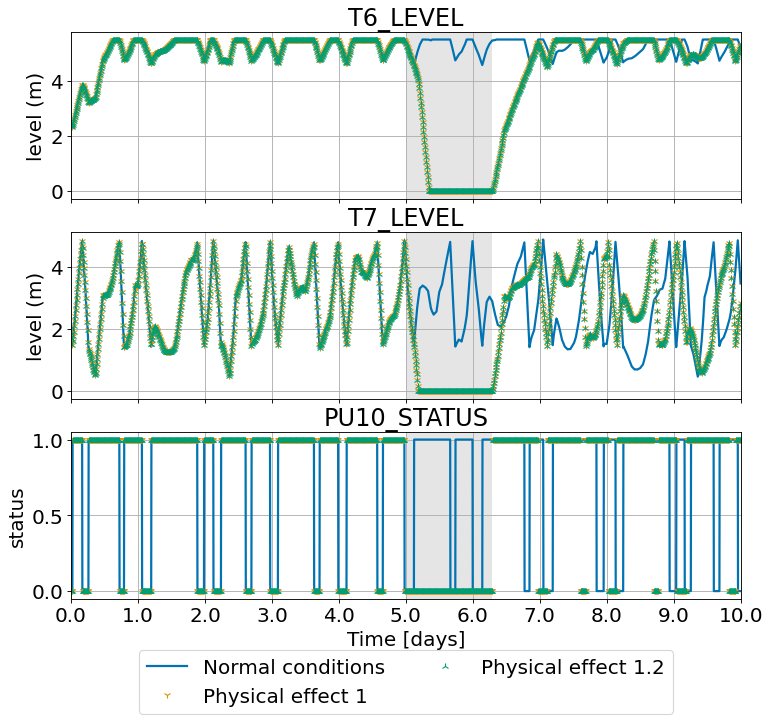

In [11]:
first_tanks = ['T6_LEVEL','T7_LEVEL', 'PU10_STATUS']
plot_attacks([normal_conditions, attack_1_no_concealment, attack_1_2_no_concealment], first_tanks, 
           ['Normal conditions','Physical effect 1', 'Physical effect 1.2'],  first_tanks, sub_filename = 'plots/1vs1_2physical', 
           y_label=['level (m)', 'level (m)', 'status'], xlim = [0,2880], markers=run_markers, dim1=27/2.5, dim2=23/2.5)

# Anomalies 1 vs 1.2 Compare Attack Strategy

(array([   0.,  500., 1000., 1500., 2000., 2500., 3000.]), [Text(0.0, 0, '0'), Text(500.0, 0, '500'), Text(1000.0, 0, '1000'), Text(1500.0, 0, '1500'), Text(2000.0, 0, '2000'), Text(2500.0, 0, '2500'), Text(3000.0, 0, '3000')])


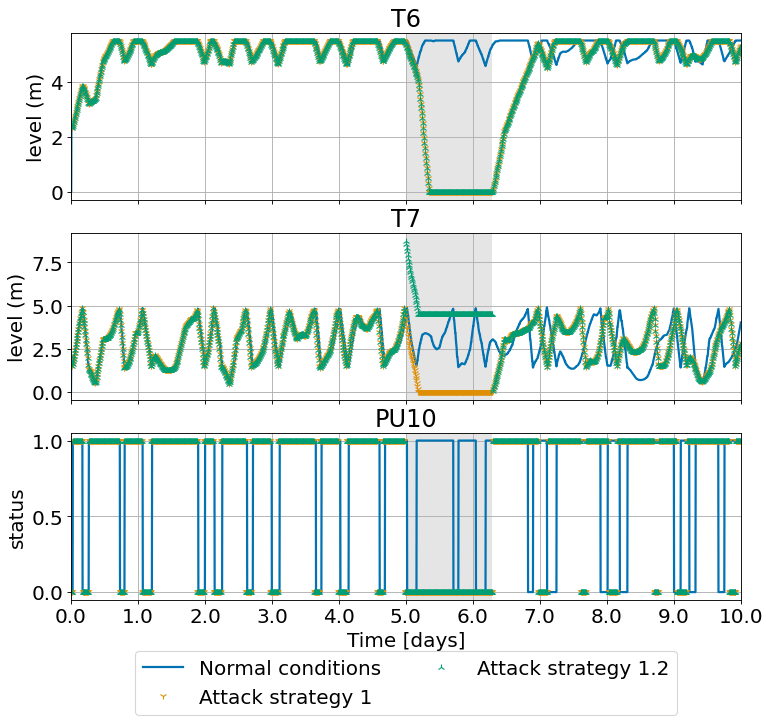

In [12]:
first_tanks = ['T6', 'T7', 'PU10']
plot_attacks([normal_conditions_scada, attack_1_no_concealment_scada, attack_1_2_no_concealment_scada], first_tanks, 
           ['Normal conditions','Attack strategy 1', 'Attack strategy 1.2'],  first_tanks, sub_filename = 'plots/1vs1_2attack_strategy', 
           y_label=['level (m)', 'level (m)', 'status'], xlim = [0,2880], markers=run_markers, dim1=27/2.5, dim2=23/2.5)

# Anomalies 1-5 Ground Truth (to check if the conceal is applied on the same physical anomaly)

(array([   0.,  500., 1000., 1500., 2000., 2500., 3000.]), [Text(0.0, 0, '0'), Text(500.0, 0, '500'), Text(1000.0, 0, '1000'), Text(1500.0, 0, '1500'), Text(2000.0, 0, '2000'), Text(2500.0, 0, '2500'), Text(3000.0, 0, '3000')])


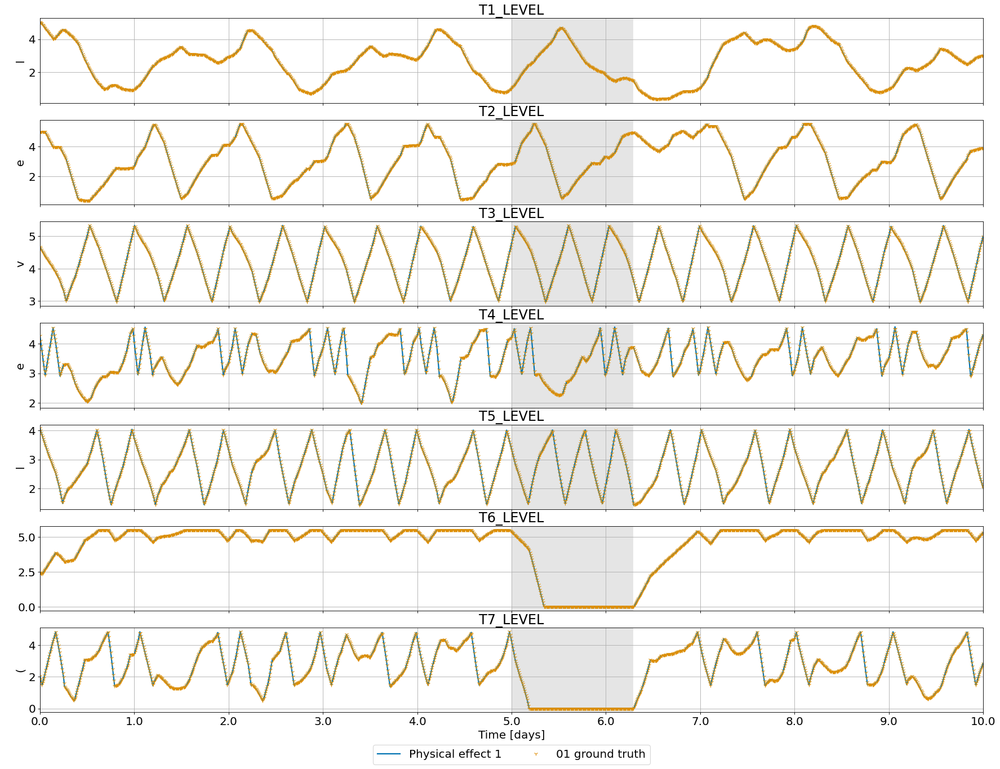

In [13]:
first_tanks = ['T1_LEVEL', 'T2_LEVEL', 'T3_LEVEL', 'T4_LEVEL', 'T5_LEVEL', 'T6_LEVEL', 'T7_LEVEL']
plot_attacks([attack_1_no_concealment, attack_01], first_tanks, 
           ['Physical effect 1', '01 ground truth'],  first_tanks, sub_filename = 'batadal_20', 
           y_label='level (m)', xlim = [0,2880], markers=run_markers)

(array([   0.,  500., 1000., 1500., 2000., 2500., 3000.]), [Text(0.0, 0, '0'), Text(500.0, 0, '500'), Text(1000.0, 0, '1000'), Text(1500.0, 0, '1500'), Text(2000.0, 0, '2000'), Text(2500.0, 0, '2500'), Text(3000.0, 0, '3000')])


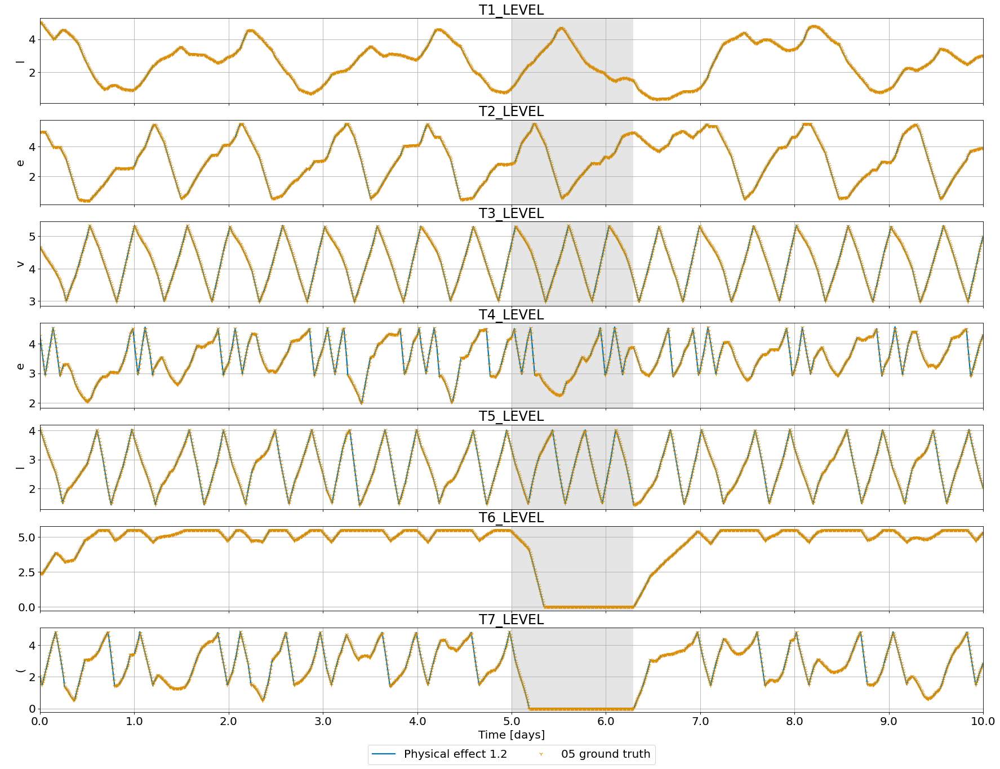

In [14]:
first_tanks = ['T1_LEVEL', 'T2_LEVEL', 'T3_LEVEL', 'T4_LEVEL', 'T5_LEVEL', 'T6_LEVEL', 'T7_LEVEL']
plot_attacks([attack_1_2_no_concealment, attack_05], first_tanks, 
           ['Physical effect 1.2', '05 ground truth'],  first_tanks, sub_filename = 'batadal_20', 
           y_label='level (m)', xlim = [0,2880], markers=run_markers)

(array([   0.,  500., 1000., 1500., 2000., 2500., 3000.]), [Text(0.0, 0, '0'), Text(500.0, 0, '500'), Text(1000.0, 0, '1000'), Text(1500.0, 0, '1500'), Text(2000.0, 0, '2000'), Text(2500.0, 0, '2500'), Text(3000.0, 0, '3000')])


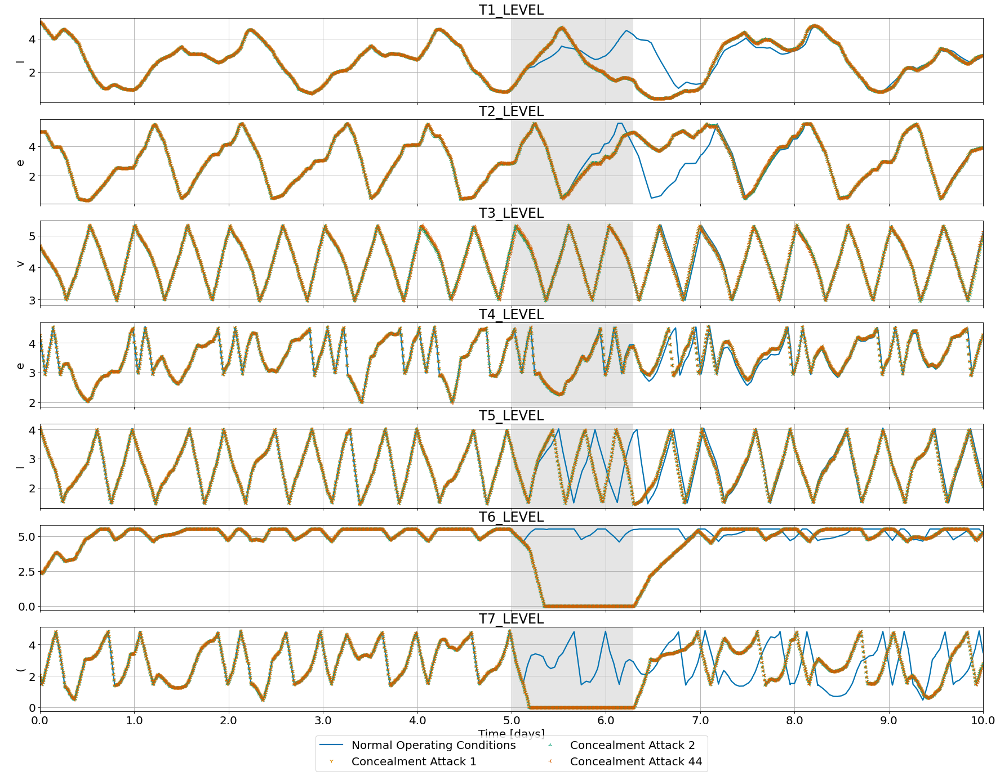

In [15]:

first_tanks = ['T1_LEVEL', 'T2_LEVEL', 'T3_LEVEL', 'T4_LEVEL', 'T5_LEVEL', 'T6_LEVEL', 'T7_LEVEL']
plot_attacks([normal_conditions, attack_01, attack_02, attack_44], first_tanks, 
           ['Normal Operating Conditions', 
            'Concealment Attack 1', 
            'Concealment Attack 2', 
            'Concealment Attack 44'],  first_tanks, sub_filename = 'batadal_20', 
           y_label='level (m)', xlim = [0,2880], markers=run_markers)

(array([   0.,  500., 1000., 1500., 2000., 2500., 3000.]), [Text(0.0, 0, '0'), Text(500.0, 0, '500'), Text(1000.0, 0, '1000'), Text(1500.0, 0, '1500'), Text(2000.0, 0, '2000'), Text(2500.0, 0, '2500'), Text(3000.0, 0, '3000')])


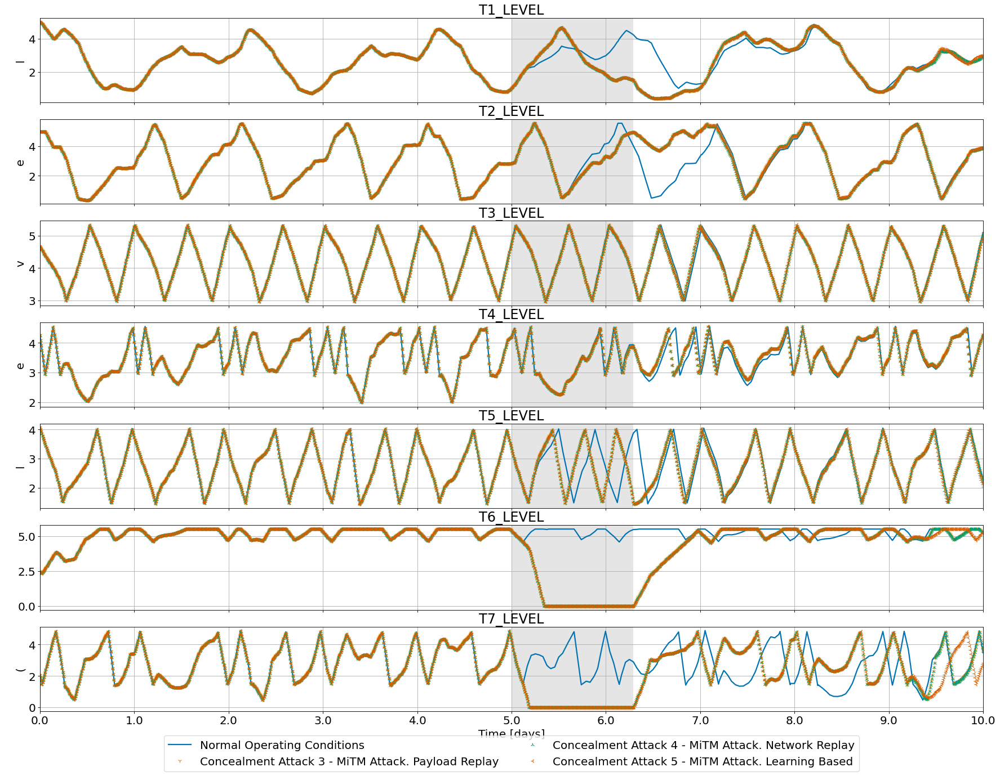

In [16]:
first_tanks = ['T1_LEVEL', 'T2_LEVEL', 'T3_LEVEL', 'T4_LEVEL', 'T5_LEVEL', 'T6_LEVEL', 'T7_LEVEL']
plot_attacks([normal_conditions, attack_03, attack_04, attack_05 ], first_tanks, 
           ['Normal Operating Conditions', 
            'Concealment Attack 3 - MiTM Attack. Payload Replay',
            'Concealment Attack 4 - MiTM Attack. Network Replay',
            'Concealment Attack 5 - MiTM Attack. Learning Based'],  first_tanks, sub_filename = 'batadal_20', 
           y_label='level (m)', xlim = [0,2880], markers=run_markers)

## Anomalies 1-5 SCADA Values

(array([   0.,  500., 1000., 1500., 2000., 2500., 3000.]), [Text(0.0, 0, '0'), Text(500.0, 0, '500'), Text(1000.0, 0, '1000'), Text(1500.0, 0, '1500'), Text(2000.0, 0, '2000'), Text(2500.0, 0, '2500'), Text(3000.0, 0, '3000')])


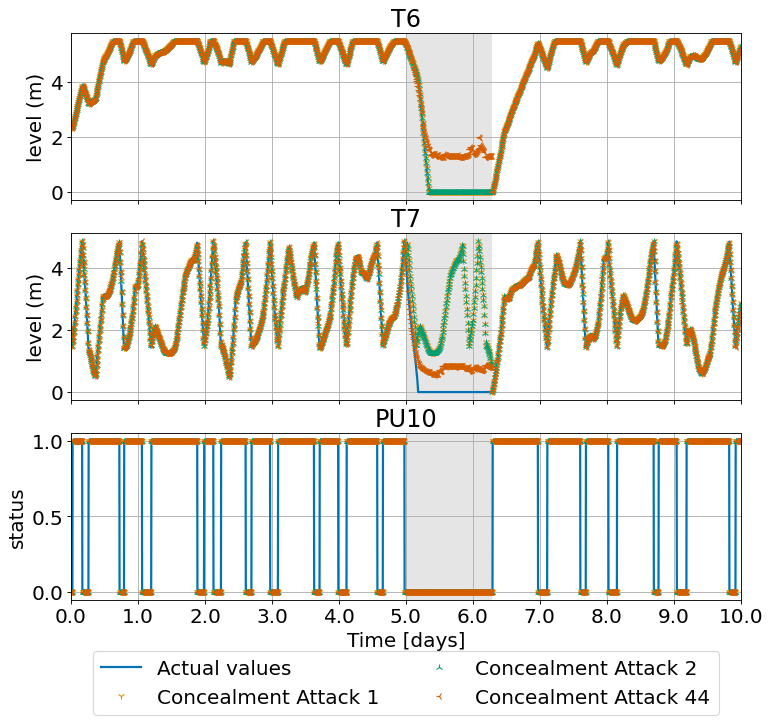

In [17]:
run_markers = ['1', '2', '3', '4', '+', 'x']
first_tanks = ['T6', 'T7','PU10']
plot_attacks([attack_1_no_concealment_scada, attack_01_scada, attack_02_scada, attack_44_scada], first_tanks, 
           ['Actual values', 
            'Concealment Attack 1', 
            'Concealment Attack 2',
            'Concealment Attack 44',
            ],  first_tanks, sub_filename = 'plots/1vs01vs02vs44scada', 
           y_label=['level (m)', 'level (m)', 'status'], xlim = [0,2880], markers=run_markers,dim1=27/2.5, dim2=23/2.5)

(array([   0.,  500., 1000., 1500., 2000., 2500., 3000.]), [Text(0.0, 0, '0'), Text(500.0, 0, '500'), Text(1000.0, 0, '1000'), Text(1500.0, 0, '1500'), Text(2000.0, 0, '2000'), Text(2500.0, 0, '2500'), Text(3000.0, 0, '3000')])


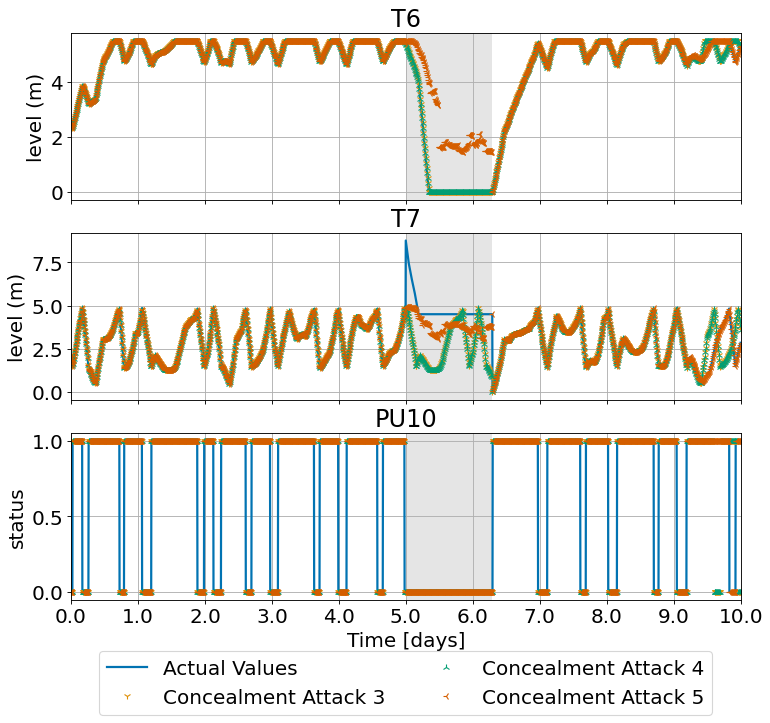

In [18]:
run_markers = ['1', '2', '3', '4', '+', 'x']
first_tanks = ['T6', 'T7','PU10']
plot_attacks([attack_1_2_no_concealment_scada, attack_03_scada, attack_04_scada, attack_05_scada], first_tanks, 
           ['Actual Values', 
            'Concealment Attack 3',
            'Concealment Attack 4',
            'Concealment Attack 5'],  first_tanks, sub_filename = 'plots/1_2vs03vs04vs05scada', 
           y_label=['level (m)', 'level (m)', 'status'], xlim = [0,2880], markers=run_markers,dim1=27/2.5, dim2=23/2.5)

# Anomalies 6-10

## Ground Truth

In [19]:
run_markers = ['1', '2', '3', '4', '+', 'x']

(array([   0.,  500., 1000., 1500., 2000., 2500., 3000.]), [Text(0.0, 0, '0'), Text(500.0, 0, '500'), Text(1000.0, 0, '1000'), Text(1500.0, 0, '1500'), Text(2000.0, 0, '2000'), Text(2500.0, 0, '2500'), Text(3000.0, 0, '3000')])


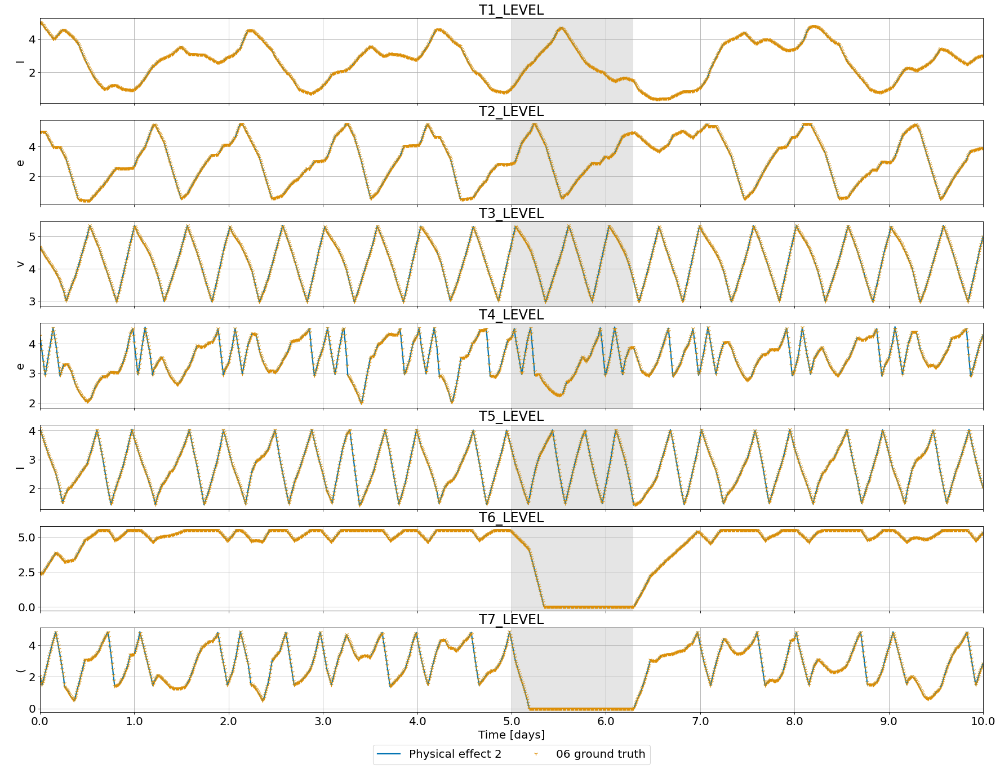

In [20]:
first_tanks = ['T1_LEVEL', 'T2_LEVEL', 'T3_LEVEL', 'T4_LEVEL', 'T5_LEVEL', 'T6_LEVEL', 'T7_LEVEL']
plot_attacks([attack_1_no_concealment, attack_06], first_tanks, 
           ['Physical effect 2', '06 ground truth'],  first_tanks, sub_filename = 'batadal_20', 
           y_label='level (m)', xlim = [0,2880], markers=run_markers,attack_begin_line=1440, attack_end_line=1812)

(array([   0.,  500., 1000., 1500., 2000., 2500., 3000.]), [Text(0.0, 0, '0'), Text(500.0, 0, '500'), Text(1000.0, 0, '1000'), Text(1500.0, 0, '1500'), Text(2000.0, 0, '2000'), Text(2500.0, 0, '2500'), Text(3000.0, 0, '3000')])


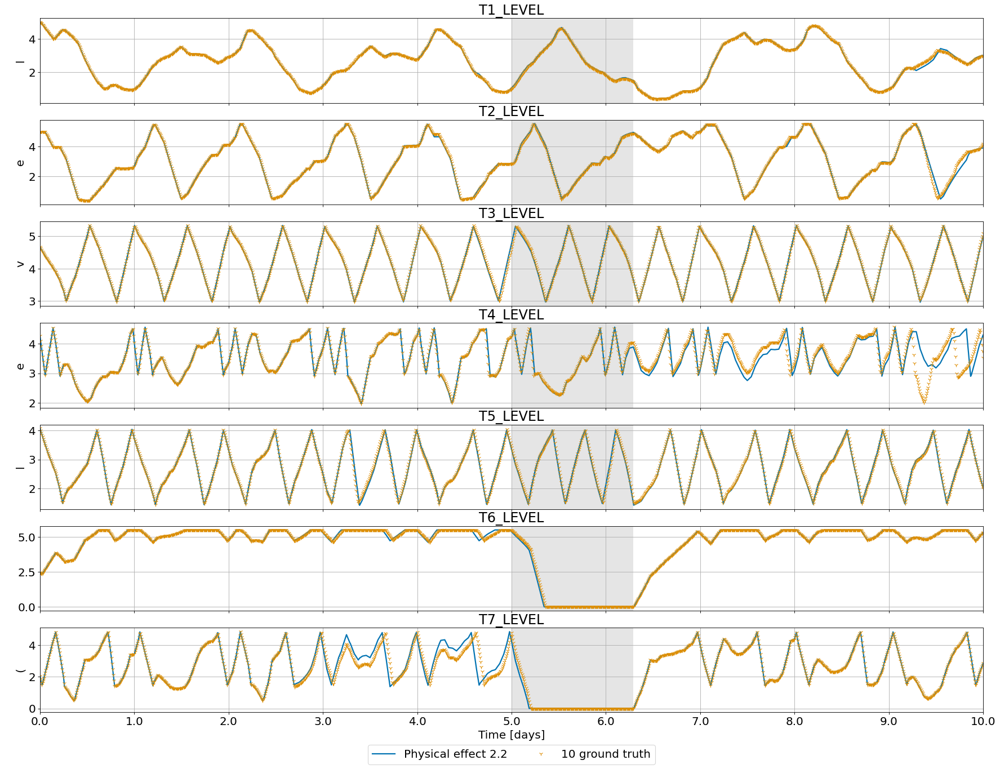

In [21]:
first_tanks = ['T1_LEVEL', 'T2_LEVEL', 'T3_LEVEL', 'T4_LEVEL', 'T5_LEVEL', 'T6_LEVEL', 'T7_LEVEL']
plot_attacks([attack_1_2_no_concealment, attack_10], first_tanks, 
           ['Physical effect 2.2', '10 ground truth'],  first_tanks, sub_filename = 'batadal_20', 
           y_label='level (m)', xlim = [0,2880], markers=run_markers,attack_begin_line=1440, attack_end_line=1812)

(array([   0.,  500., 1000., 1500., 2000., 2500., 3000.]), [Text(0.0, 0, '0'), Text(500.0, 0, '500'), Text(1000.0, 0, '1000'), Text(1500.0, 0, '1500'), Text(2000.0, 0, '2000'), Text(2500.0, 0, '2500'), Text(3000.0, 0, '3000')])


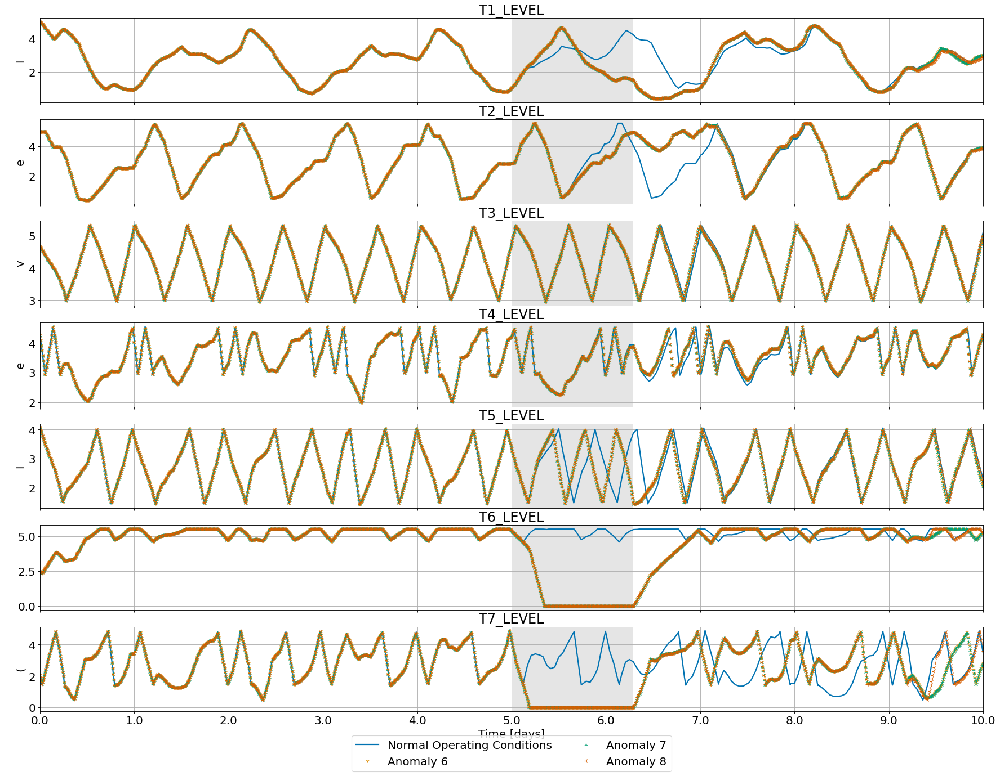

In [22]:
first_tanks = ['T1_LEVEL', 'T2_LEVEL', 'T3_LEVEL', 'T4_LEVEL', 'T5_LEVEL', 'T6_LEVEL', 'T7_LEVEL']
plot_attacks([normal_conditions, attack_06, attack_07, attack_08 ], first_tanks, 
           ['Normal Operating Conditions', 
            'Anomaly 6',
            'Anomaly 7',
            'Anomaly 8'],  first_tanks, sub_filename = 'batadal_20', 
           y_label='level (m)', xlim = [0,2880], markers=run_markers,attack_begin_line=1440, attack_end_line=1812)

(array([   0.,  500., 1000., 1500., 2000., 2500., 3000.]), [Text(0.0, 0, '0'), Text(500.0, 0, '500'), Text(1000.0, 0, '1000'), Text(1500.0, 0, '1500'), Text(2000.0, 0, '2000'), Text(2500.0, 0, '2500'), Text(3000.0, 0, '3000')])


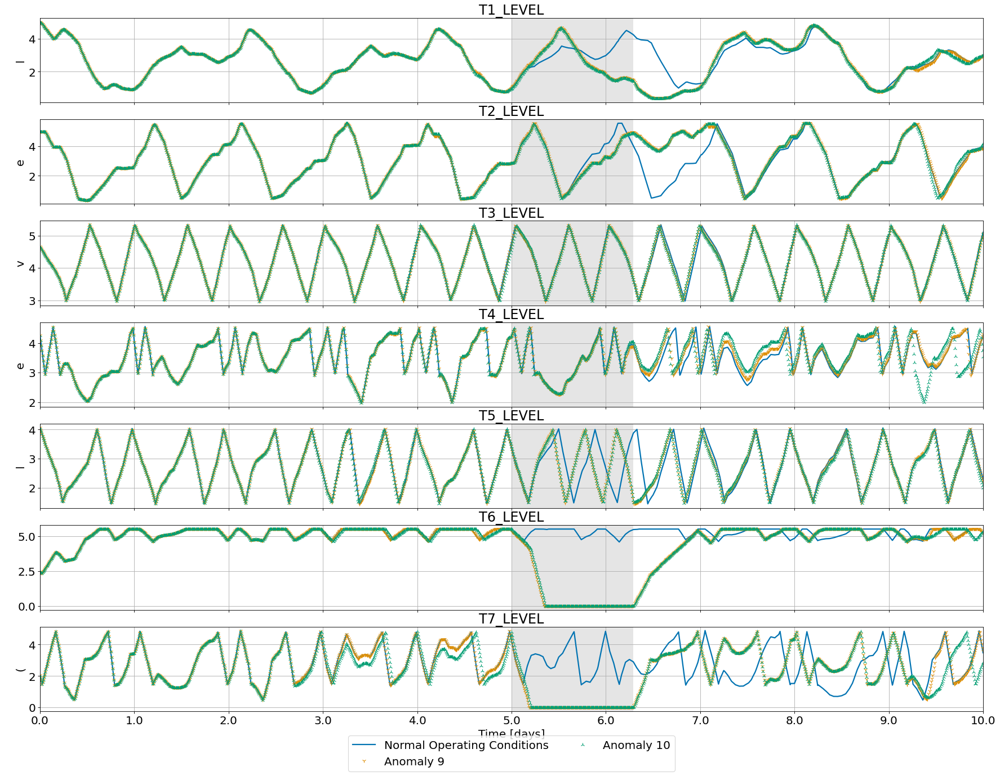

In [23]:
run_markers = ['1', '2', '3', '4', '+', 'x']
first_tanks = ['T1_LEVEL', 'T2_LEVEL', 'T3_LEVEL', 'T4_LEVEL', 'T5_LEVEL', 'T6_LEVEL', 'T7_LEVEL']
plot_attacks([normal_conditions, attack_09, attack_10 ], first_tanks, 
           ['Normal Operating Conditions', 
            'Anomaly 9',
            'Anomaly 10'],  first_tanks, sub_filename = 'batadal_20', 
           y_label='level (m)', xlim = [0,2880], markers=run_markers,attack_begin_line=1440, attack_end_line=1812)

## SCADA Values

(array([   0.,  500., 1000., 1500., 2000., 2500., 3000.]), [Text(0.0, 0, '0'), Text(500.0, 0, '500'), Text(1000.0, 0, '1000'), Text(1500.0, 0, '1500'), Text(2000.0, 0, '2000'), Text(2500.0, 0, '2500'), Text(3000.0, 0, '3000')])


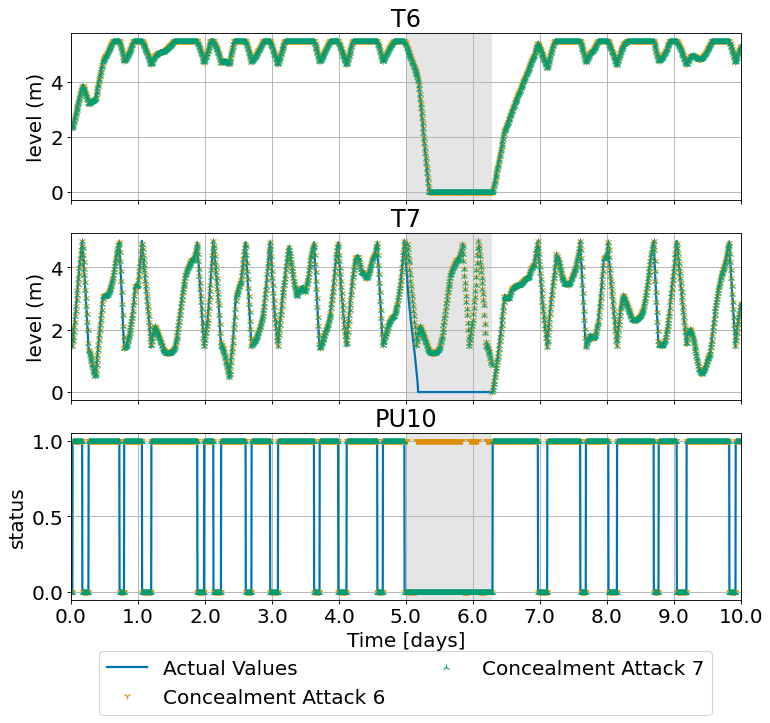

In [24]:
run_markers = ['1', '2', '3', '4', '+', 'x']
first_tanks = ['T6', 'T7','PU10']
plot_attacks([attack_1_no_concealment_scada, attack_06_scada, attack_07_scada], first_tanks, 
           ['Actual Values', 
             'Concealment Attack 6' ,
            'Concealment Attack 7'],  first_tanks, sub_filename = 'plots/1vs06vs07scada', 
            y_label=['level (m)', 'level (m)', 'status'], xlim = [0,2880], markers=run_markers,attack_begin_line=1440, attack_end_line=1812,
            dim1=27/2.5, dim2=23/2.5)

(array([   0.,  500., 1000., 1500., 2000., 2500., 3000.]), [Text(0.0, 0, '0'), Text(500.0, 0, '500'), Text(1000.0, 0, '1000'), Text(1500.0, 0, '1500'), Text(2000.0, 0, '2000'), Text(2500.0, 0, '2500'), Text(3000.0, 0, '3000')])


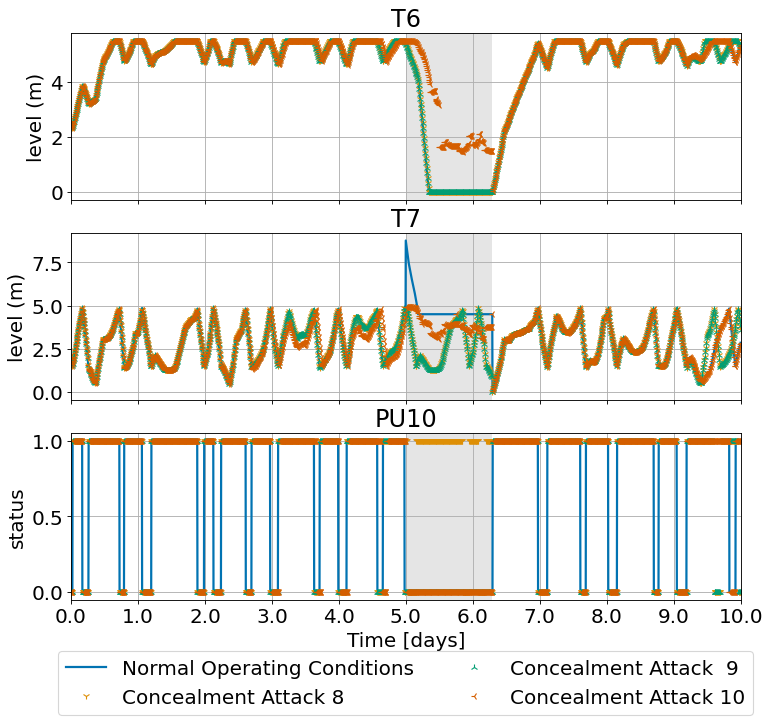

In [25]:
first_tanks = ['T6', 'T7','PU10']
plot_attacks([attack_1_2_no_concealment_scada, attack_08_scada,attack_09_scada, attack_10_scada], first_tanks, 
           ['Normal Operating Conditions',
            'Concealment Attack 8',
            'Concealment Attack  9',
            'Concealment Attack 10'
           ]
            ,  first_tanks, sub_filename = 'plots/1_2vs08vs09vs10scada', 
           y_label=['level (m)', 'level (m)', 'status'], xlim = [0,2880], markers=run_markers,attack_begin_line=1440, attack_end_line=1812,
            dim1=27/2.5, dim2=23/2.5)

# Anomalies 3 vs 4 Compare Physical Effect

(array([   0.,  500., 1000., 1500., 2000., 2500., 3000.]), [Text(0.0, 0, '0'), Text(500.0, 0, '500'), Text(1000.0, 0, '1000'), Text(1500.0, 0, '1500'), Text(2000.0, 0, '2000'), Text(2500.0, 0, '2500'), Text(3000.0, 0, '3000')])


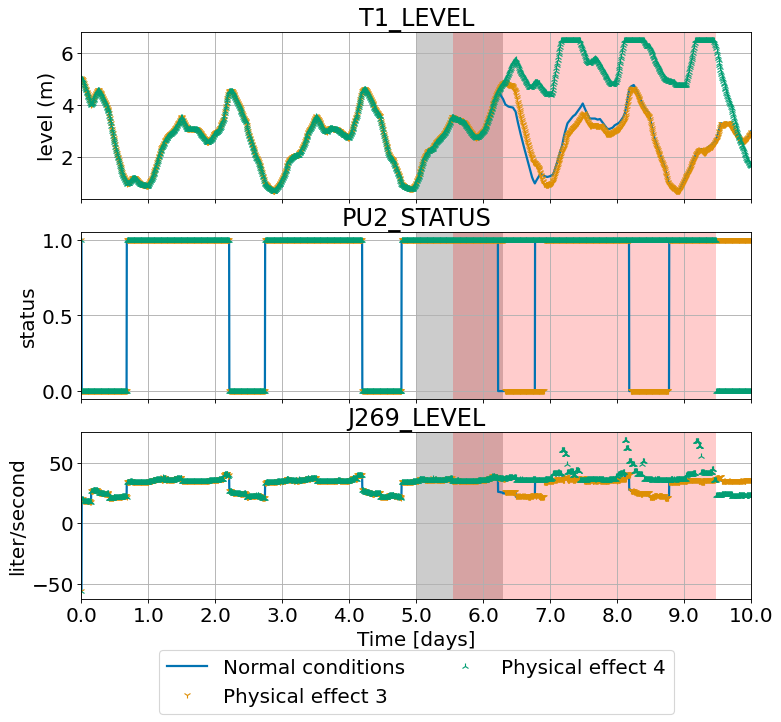

In [26]:
first_tanks = ['T1_LEVEL','PU2_STATUS', 'J269_LEVEL']
plot_attacks([normal_conditions, attack_3_no_concealment, attack_4_no_concealment], first_tanks, 
           ['Normal conditions','Physical effect 3', 'Physical effect 4'],  first_tanks,
             sub_filename = 'plots/3vs4physical', 
            y_label=['level (m)', 'status', 'liter/second'], xlim = [0,2880], markers=run_markers, 
             attack_begin_line=[1440, 1600], attack_end_line=[1812, 2728], dim1=27/2.5, dim2=23/2.5)

# Anomalies 3 vs 4 Compare Attack Strategy

(array([   0.,  500., 1000., 1500., 2000., 2500., 3000.]), [Text(0.0, 0, '0'), Text(500.0, 0, '500'), Text(1000.0, 0, '1000'), Text(1500.0, 0, '1500'), Text(2000.0, 0, '2000'), Text(2500.0, 0, '2500'), Text(3000.0, 0, '3000')])


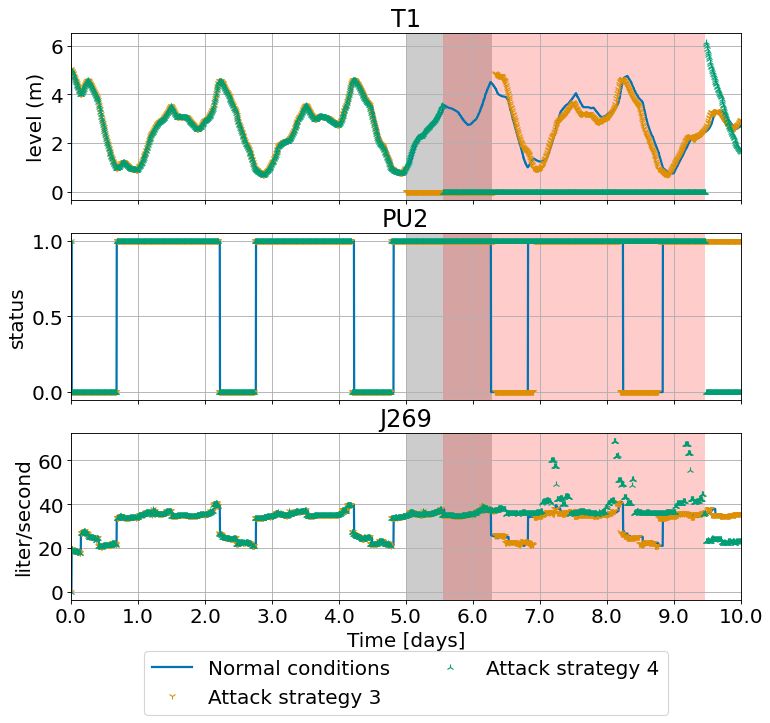

In [27]:
first_tanks = ['T1', 'PU2', 'J269']
plot_attacks([normal_conditions_scada, attack_3_no_concealment_scada, attack_4_no_concealment_scada], first_tanks, 
           ['Normal conditions','Attack strategy 3', 'Attack strategy 4'],  first_tanks,
             sub_filename = 'plots/3vs4attack_strategy', 
           y_label=['level (m)', 'status', 'liter/second'], xlim = [0,2880], markers=run_markers, 
             attack_begin_line=[1440, 1600], attack_end_line=[1812, 2728], dim1=27/2.5, dim2=23/2.5)

# Anomalies 11-13 Ground Truth 

(array([   0.,  500., 1000., 1500., 2000., 2500., 3000.]), [Text(0.0, 0, '0'), Text(500.0, 0, '500'), Text(1000.0, 0, '1000'), Text(1500.0, 0, '1500'), Text(2000.0, 0, '2000'), Text(2500.0, 0, '2500'), Text(3000.0, 0, '3000')])


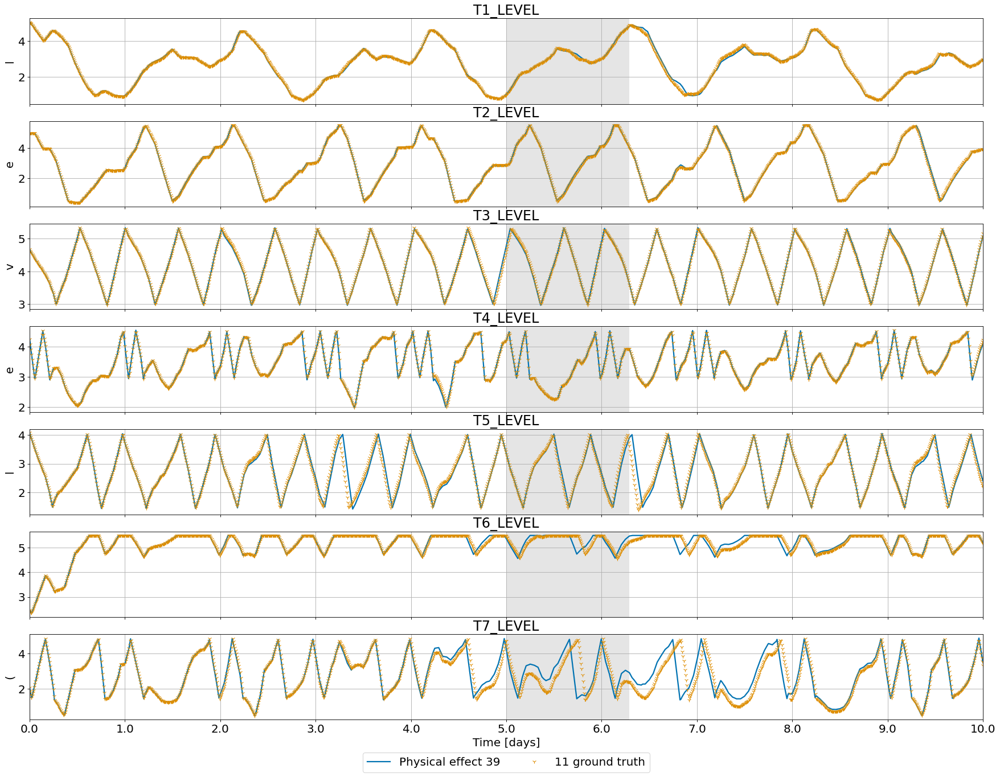

In [28]:
first_tanks = ['T1_LEVEL', 'T2_LEVEL', 'T3_LEVEL', 'T4_LEVEL', 'T5_LEVEL', 'T6_LEVEL', 'T7_LEVEL']
plot_attacks([attack_3_no_concealment, attack_13], first_tanks, 
           ['Physical effect 39', '11 ground truth'],  first_tanks, sub_filename = 'batadal_20', 
           y_label='level (m)', xlim = [0,2880], markers=run_markers,attack_begin_line=1440, attack_end_line=1812)

(array([   0.,  500., 1000., 1500., 2000., 2500., 3000.]), [Text(0.0, 0, '0'), Text(500.0, 0, '500'), Text(1000.0, 0, '1000'), Text(1500.0, 0, '1500'), Text(2000.0, 0, '2000'), Text(2500.0, 0, '2500'), Text(3000.0, 0, '3000')])


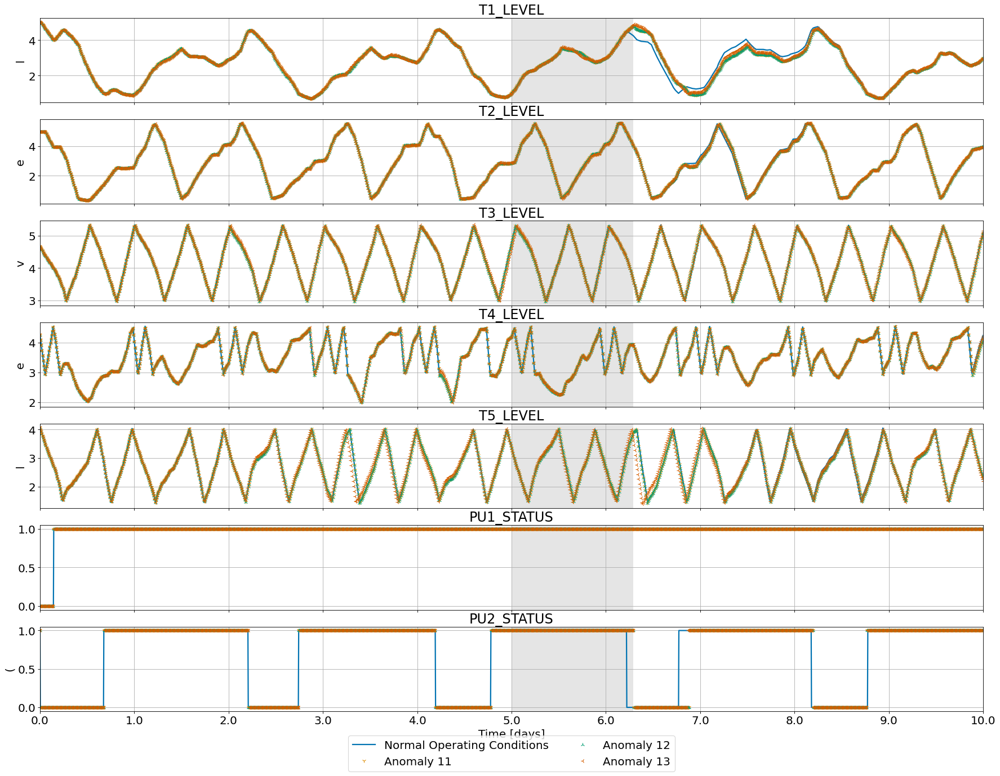

In [29]:
run_markers = ['1', '2', '3', '4', '+', 'x']
first_tanks = ['T1_LEVEL', 'T2_LEVEL', 'T3_LEVEL', 'T4_LEVEL', 'T5_LEVEL', 'PU1_STATUS', 'PU2_STATUS']
plot_attacks([normal_conditions, attack_11, attack_12, attack_13], first_tanks, 
           ['Normal Operating Conditions', 
            'Anomaly 11',
            'Anomaly 12', 'Anomaly 13'],  first_tanks, sub_filename = 'batadal_20', 
           y_label='level (m)', xlim = [0,2880], markers=run_markers, attack_begin_line=1440, attack_end_line=1812)

# Anomalies 11-13 SCADA Values

(array([   0.,  500., 1000., 1500., 2000., 2500., 3000.]), [Text(0.0, 0, '0'), Text(500.0, 0, '500'), Text(1000.0, 0, '1000'), Text(1500.0, 0, '1500'), Text(2000.0, 0, '2000'), Text(2500.0, 0, '2500'), Text(3000.0, 0, '3000')])


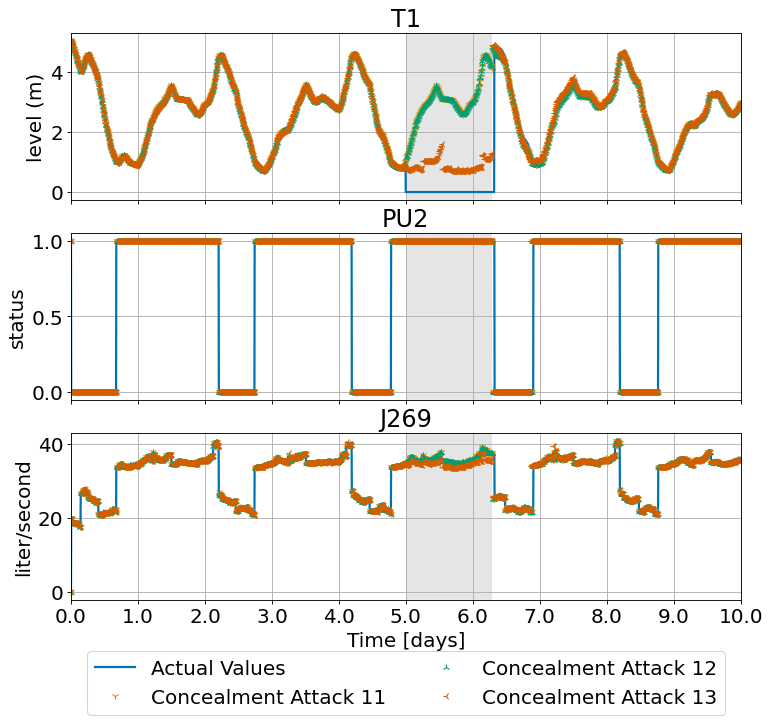

In [30]:
run_markers = ['1', '2', '3', '4', '+', 'x']
first_tanks = ['T1', 'PU2', 'J269']
plot_attacks([attack_3_no_concealment_scada, attack_11_scada, attack_12_scada, attack_13_scada], first_tanks, 
           ['Actual Values', 
            'Concealment Attack 11', 'Concealment Attack 12', 'Concealment Attack 13' ],  first_tanks, sub_filename = 'plots/3vs11vs12vs13scada', 
           y_label=['level (m)', 'status', 'liter/second'], xlim = [0,2880], markers=run_markers, attack_begin_line=1440, attack_end_line=1812, dim1=27/2.5, dim2=23/2.5)

# Anomalies 14-15 Ground Truth 

(array([   0.,  500., 1000., 1500., 2000., 2500., 3000.]), [Text(0.0, 0, '0'), Text(500.0, 0, '500'), Text(1000.0, 0, '1000'), Text(1500.0, 0, '1500'), Text(2000.0, 0, '2000'), Text(2500.0, 0, '2500'), Text(3000.0, 0, '3000')])


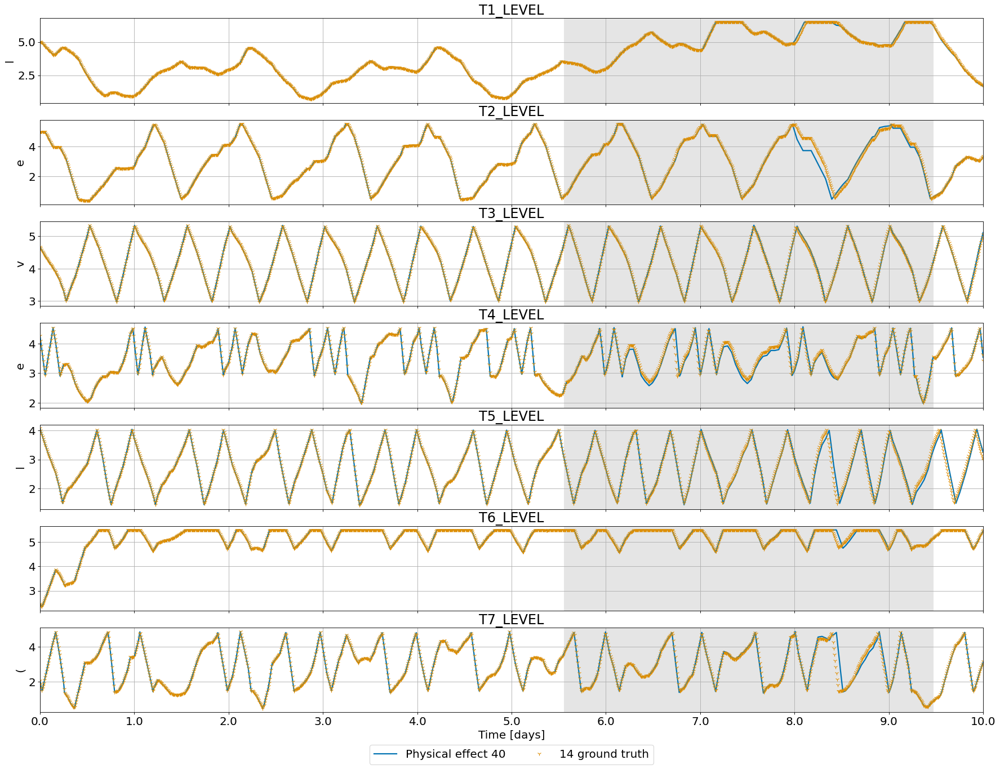

In [31]:
first_tanks = ['T1_LEVEL', 'T2_LEVEL', 'T3_LEVEL', 'T4_LEVEL', 'T5_LEVEL', 'T6_LEVEL', 'T7_LEVEL']
plot_attacks([attack_4_no_concealment, attack_14], first_tanks, 
           ['Physical effect 40', '14 ground truth'],  first_tanks, sub_filename = 'batadal_20', 
           y_label='level (m)', xlim = [0,2880], markers=run_markers,attack_begin_line=1600, attack_end_line=2728)

(array([   0.,  500., 1000., 1500., 2000., 2500., 3000.]), [Text(0.0, 0, '0'), Text(500.0, 0, '500'), Text(1000.0, 0, '1000'), Text(1500.0, 0, '1500'), Text(2000.0, 0, '2000'), Text(2500.0, 0, '2500'), Text(3000.0, 0, '3000')])


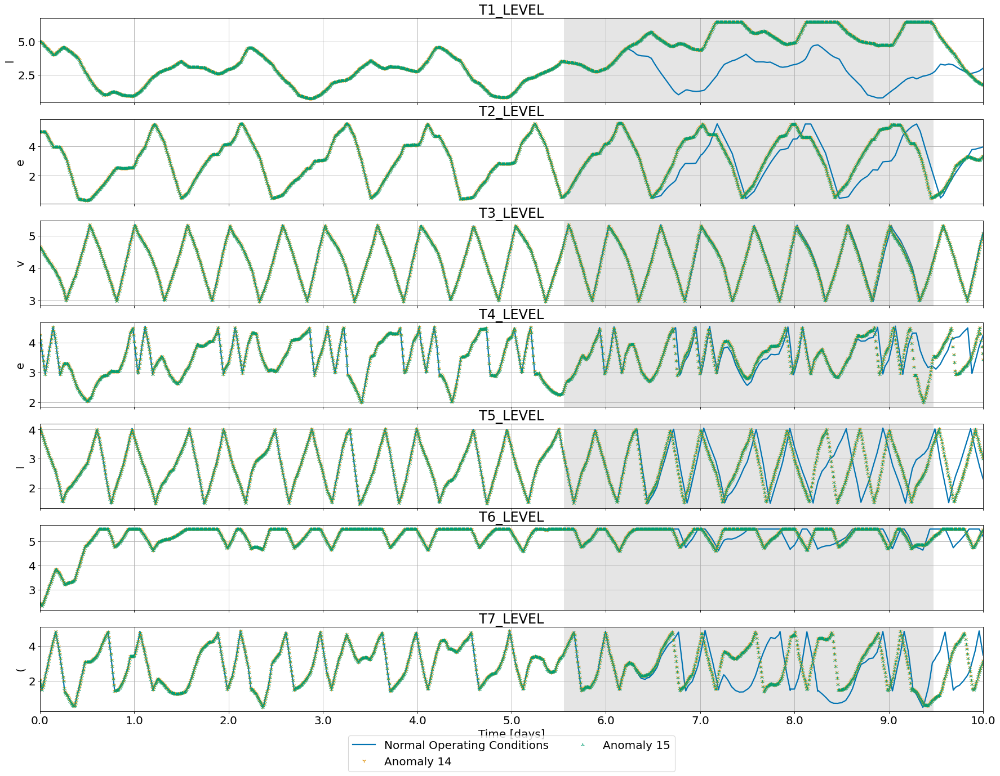

In [32]:
plot_attacks([normal_conditions, attack_14, attack_15], first_tanks,
           ['Normal Operating Conditions', 
            'Anomaly 14',
            'Anomaly 15'],  first_tanks, sub_filename = 'batadal_20', 
           y_label='level (m)', xlim = [0,2880], markers=run_markers, attack_begin_line=1600, attack_end_line=2728)

# Anomalies 14-15 SCADA Values

(array([   0.,  500., 1000., 1500., 2000., 2500., 3000.]), [Text(0.0, 0, '0'), Text(500.0, 0, '500'), Text(1000.0, 0, '1000'), Text(1500.0, 0, '1500'), Text(2000.0, 0, '2000'), Text(2500.0, 0, '2500'), Text(3000.0, 0, '3000')])


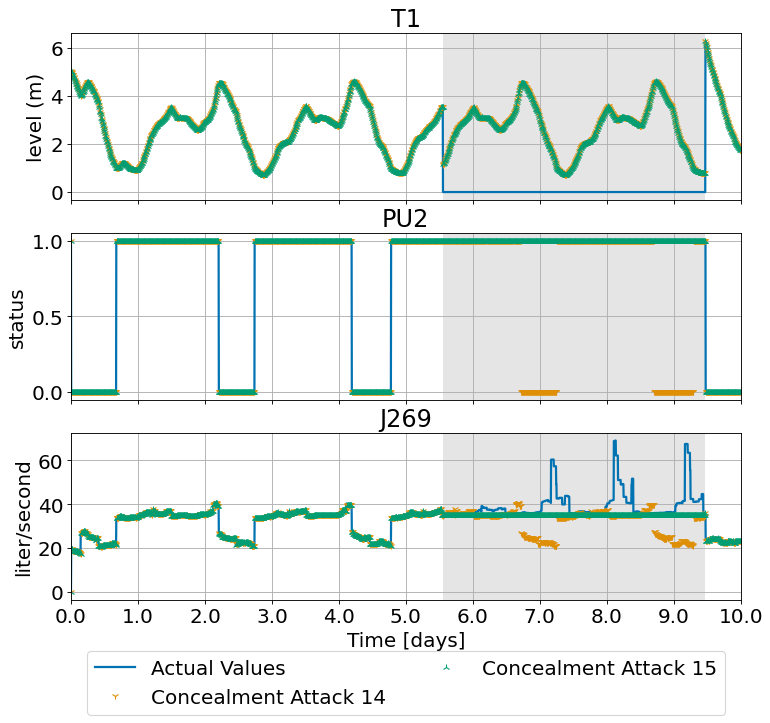

In [33]:
run_markers = ['1', '2', '3', '4', '+', 'x']
first_tanks = ['T1', 'PU2', 'J269']
plot_attacks([attack_4_no_concealment_scada, attack_14_scada, attack_15_scada], first_tanks, 
           ['Actual Values', 
            'Concealment Attack 14' ,
            'Concealment Attack 15'],  first_tanks, sub_filename = 'plots/4vs14vs15scada', 
           y_label=['level (m)', 'status', 'liter/second'], xlim = [0,2880], markers=run_markers, attack_begin_line=1600, attack_end_line=2728, dim1=27/2.5, dim2=23/2.5)

# Anomalies 9 vs 12 Compare Physical Effect

(array([   0.,  500., 1000., 1500., 2000., 2500., 3000.]), [Text(0.0, 0, '0'), Text(500.0, 0, '500'), Text(1000.0, 0, '1000'), Text(1500.0, 0, '1500'), Text(2000.0, 0, '2000'), Text(2500.0, 0, '2500'), Text(3000.0, 0, '3000')])


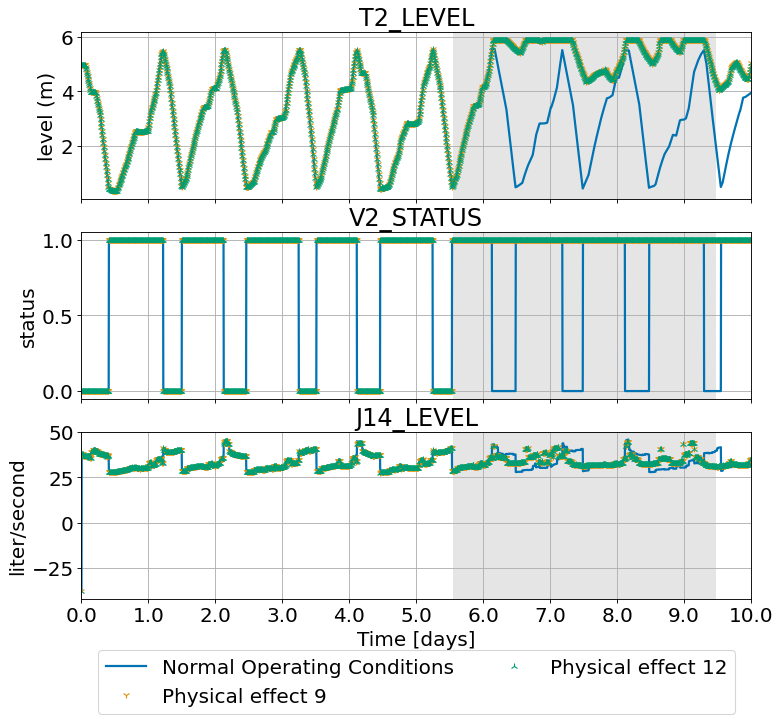

In [34]:
run_markers = ['1', '2', '3', '4', '+', 'x']
first_tanks = ['T2_LEVEL', 'V2_STATUS', 'J14_LEVEL']
plot_attacks([normal_conditions, attack_9_no_concealment, attack_12_no_concealment], first_tanks, 
           ['Normal Operating Conditions', 
            'Physical effect 9',
            'Physical effect 12'],  first_tanks, sub_filename = 'plots/9vs12physical', 
           y_label=['level (m)', 'status', 'liter/second'], xlim = [0,2880], markers=run_markers, attack_begin_line=1600, attack_end_line=2728,
            dim1=27/2.5,dim2=23/2.5)

(array([   0.,  500., 1000., 1500., 2000., 2500., 3000.]), [Text(0.0, 0, '0'), Text(500.0, 0, '500'), Text(1000.0, 0, '1000'), Text(1500.0, 0, '1500'), Text(2000.0, 0, '2000'), Text(2500.0, 0, '2500'), Text(3000.0, 0, '3000')])


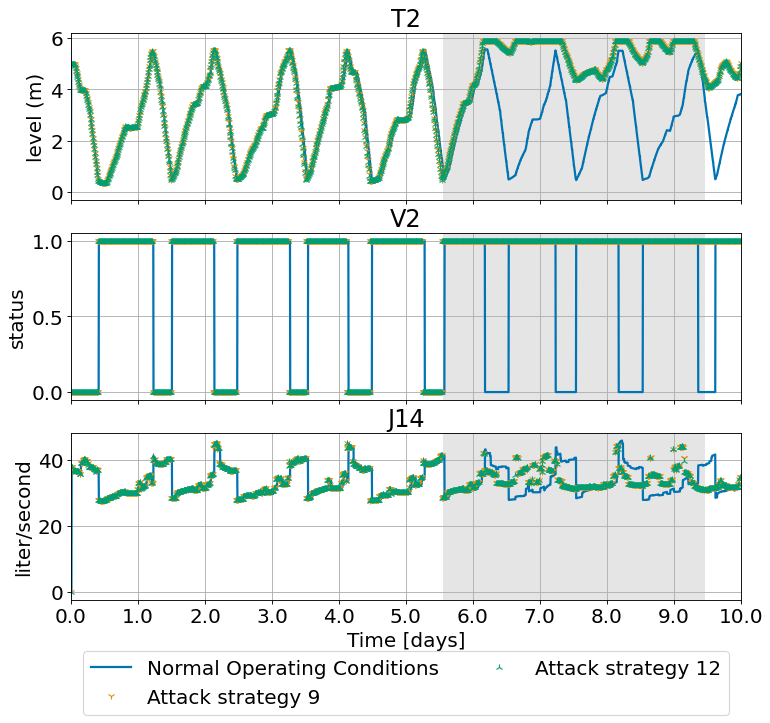

In [35]:
run_markers = ['1', '2', '3', '4', '+', 'x']
first_tanks = ['T2', 'V2', 'J14']
plot_attacks([normal_conditions_scada, attack_9_no_concealment_scada, attack_12_no_concealment_scada], first_tanks, 
           ['Normal Operating Conditions', 
            'Attack strategy 9',
            'Attack strategy 12'],  first_tanks, sub_filename = 'plots/9vs12attack_strategy', 
           y_label=['level (m)', 'status', 'liter/second'], xlim = [0,2880], markers=run_markers, attack_begin_line=1600, attack_end_line=2728,
            dim1=27/2.5,dim2=23/2.5)

# Anomalies 25-26 Ground Truth 

(array([   0.,  500., 1000., 1500., 2000., 2500., 3000.]), [Text(0.0, 0, '0'), Text(500.0, 0, '500'), Text(1000.0, 0, '1000'), Text(1500.0, 0, '1500'), Text(2000.0, 0, '2000'), Text(2500.0, 0, '2500'), Text(3000.0, 0, '3000')])


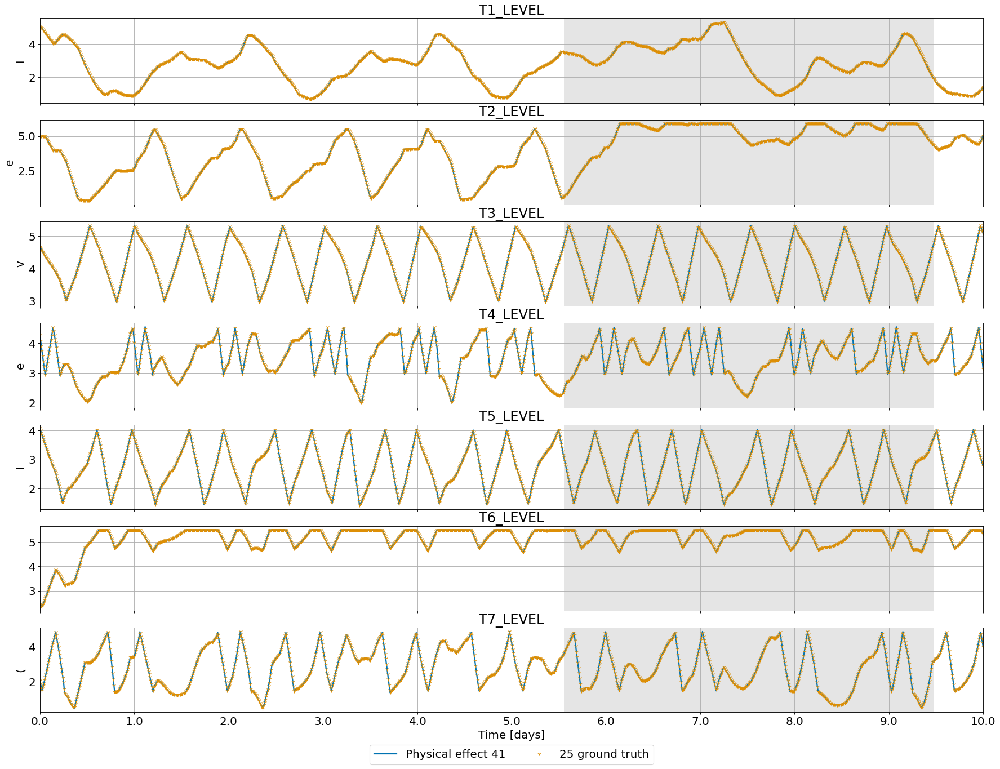

In [36]:
first_tanks = ['T1_LEVEL', 'T2_LEVEL', 'T3_LEVEL', 'T4_LEVEL', 'T5_LEVEL', 'T6_LEVEL', 'T7_LEVEL']
plot_attacks([attack_9_no_concealment, attack_25], first_tanks, 
           ['Physical effect 41', '25 ground truth'],  first_tanks, sub_filename = 'batadal_20', 
           y_label='level (m)', xlim = [0,2880], markers=run_markers,attack_begin_line=1600, attack_end_line=2728)

(array([   0.,  500., 1000., 1500., 2000., 2500., 3000.]), [Text(0.0, 0, '0'), Text(500.0, 0, '500'), Text(1000.0, 0, '1000'), Text(1500.0, 0, '1500'), Text(2000.0, 0, '2000'), Text(2500.0, 0, '2500'), Text(3000.0, 0, '3000')])


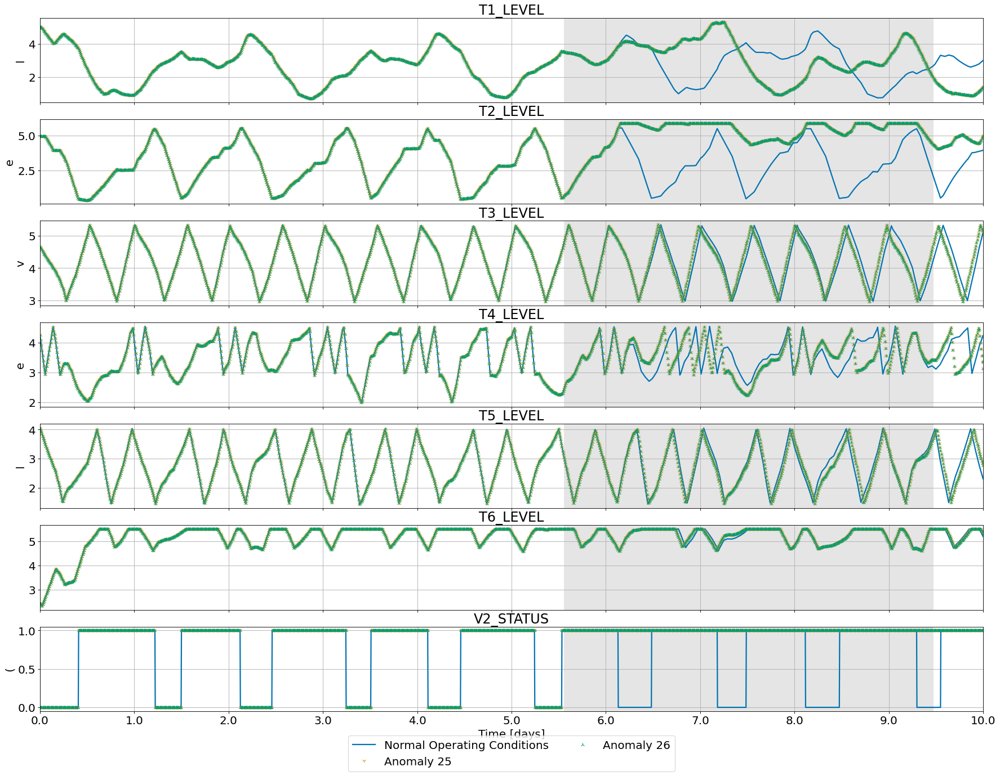

In [37]:
first_tanks = ['T1_LEVEL', 'T2_LEVEL', 'T3_LEVEL', 'T4_LEVEL', 'T5_LEVEL', 'T6_LEVEL', 'V2_STATUS']
plot_attacks([normal_conditions, attack_25, attack_26], first_tanks, 
           ['Normal Operating Conditions', 
            'Anomaly 25',
            'Anomaly 26'],  first_tanks, sub_filename = 'batadal_20', 
           y_label='level (m)', xlim = [0,2880], markers=run_markers, attack_begin_line=1600, attack_end_line=2728)

# Anomalies 25-26 SCADA Values

(array([   0.,  500., 1000., 1500., 2000., 2500., 3000.]), [Text(0.0, 0, '0'), Text(500.0, 0, '500'), Text(1000.0, 0, '1000'), Text(1500.0, 0, '1500'), Text(2000.0, 0, '2000'), Text(2500.0, 0, '2500'), Text(3000.0, 0, '3000')])


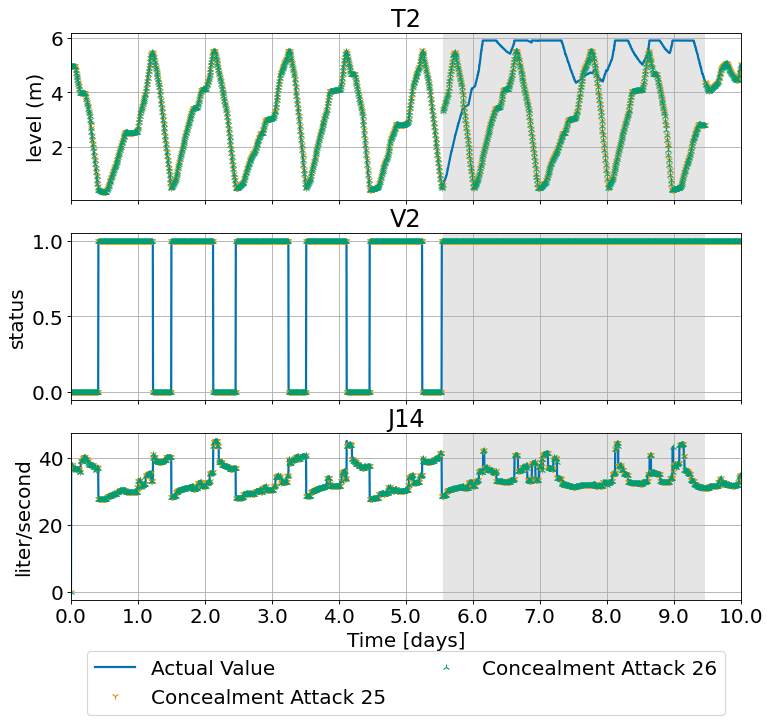

In [38]:
run_markers = ['1', '2', '3', '4', '+', 'x']
first_tanks = ['T2', 'V2', 'J14']
plot_attacks([attack_9_no_concealment_scada, attack_25_scada, attack_26_scada], first_tanks, 
           ['Actual Value', 
            'Concealment Attack 25' ,
            'Concealment Attack 26'],  first_tanks, sub_filename = 'plots/9vs25vs26scada', 
           y_label=['level (m)', 'status', 'liter/second'], xlim = [0,2880], markers=run_markers,attack_begin_line=1600, attack_end_line=2728,
            dim1=27/2.5, dim2=23/2.5)

# Anomalies 27-29 Ground Truth 

(array([   0.,  500., 1000., 1500., 2000., 2500., 3000.]), [Text(0.0, 0, '0'), Text(500.0, 0, '500'), Text(1000.0, 0, '1000'), Text(1500.0, 0, '1500'), Text(2000.0, 0, '2000'), Text(2500.0, 0, '2500'), Text(3000.0, 0, '3000')])


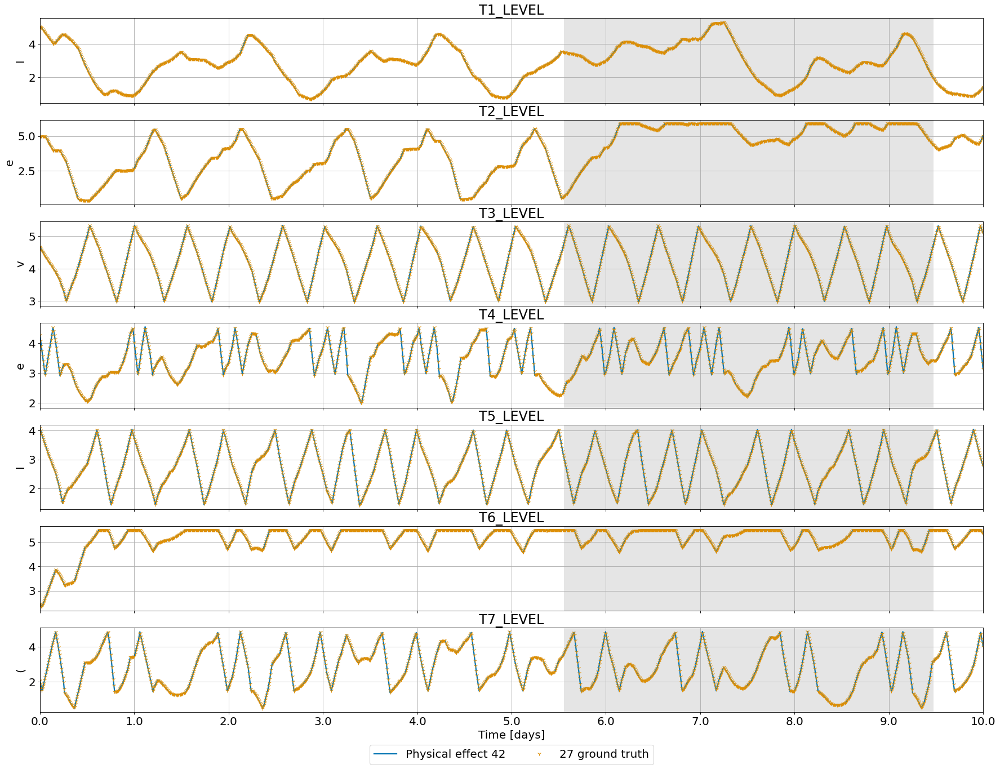

In [39]:
first_tanks = ['T1_LEVEL', 'T2_LEVEL', 'T3_LEVEL', 'T4_LEVEL', 'T5_LEVEL', 'T6_LEVEL', 'T7_LEVEL']
plot_attacks([attack_12_no_concealment, attack_27], first_tanks, 
           ['Physical effect 42', '27 ground truth'],  first_tanks, sub_filename = 'batadal_20', 
           y_label='level (m)', xlim = [0,2880], markers=run_markers,attack_begin_line=1600, attack_end_line=2728)

(array([   0.,  500., 1000., 1500., 2000., 2500., 3000.]), [Text(0.0, 0, '0'), Text(500.0, 0, '500'), Text(1000.0, 0, '1000'), Text(1500.0, 0, '1500'), Text(2000.0, 0, '2000'), Text(2500.0, 0, '2500'), Text(3000.0, 0, '3000')])


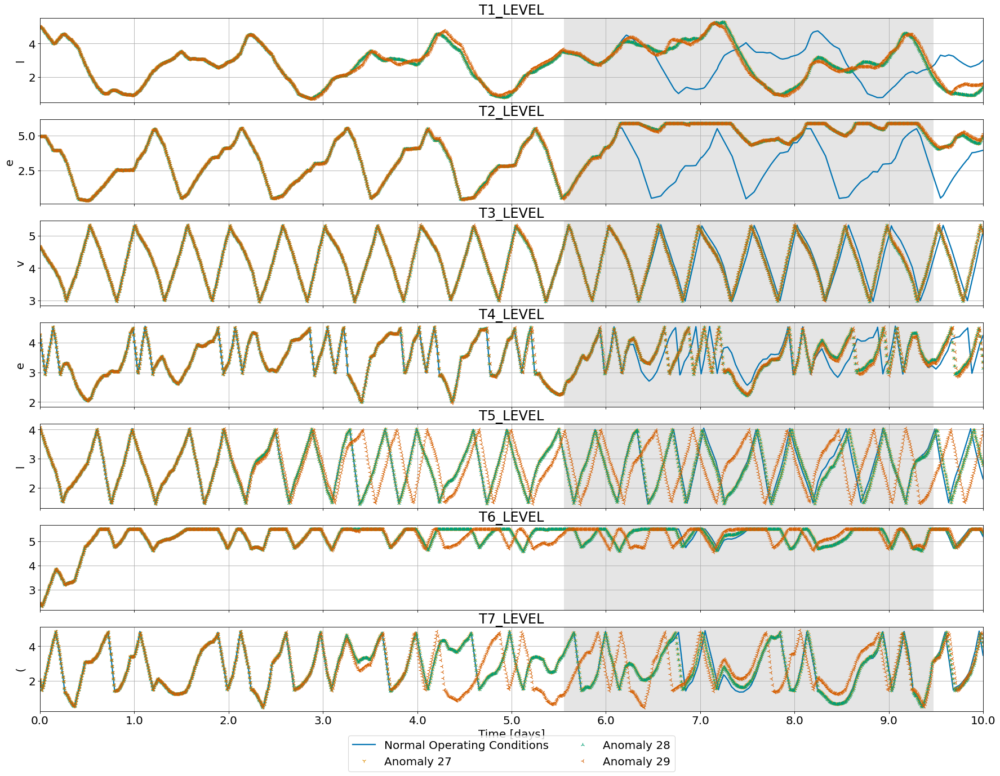

In [40]:
first_tanks = ['T1_LEVEL', 'T2_LEVEL', 'T3_LEVEL', 'T4_LEVEL', 'T5_LEVEL', 'T6_LEVEL', 'T7_LEVEL']
plot_attacks([normal_conditions, attack_27, attack_28, attack_29], first_tanks, 
           ['Normal Operating Conditions', 
            'Anomaly 27',
            'Anomaly 28',
            'Anomaly 29'],  first_tanks, sub_filename = 'batadal_20', 
           y_label='level (m)', xlim = [0,2880], markers=run_markers,attack_begin_line=1600, attack_end_line=2728)

# Anomalies 27-29 SCADA Values

(array([   0.,  500., 1000., 1500., 2000., 2500., 3000.]), [Text(0.0, 0, '0'), Text(500.0, 0, '500'), Text(1000.0, 0, '1000'), Text(1500.0, 0, '1500'), Text(2000.0, 0, '2000'), Text(2500.0, 0, '2500'), Text(3000.0, 0, '3000')])


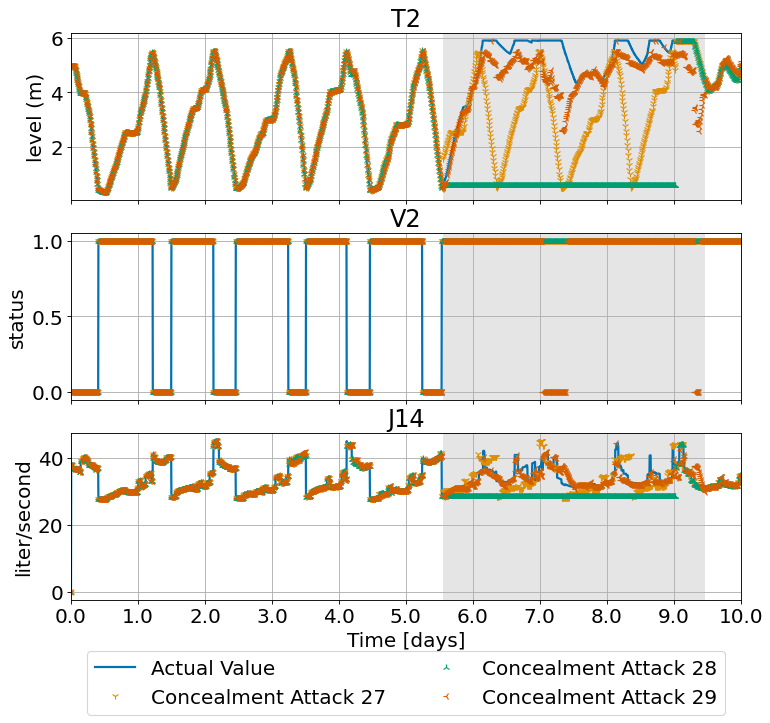

In [41]:
run_markers = ['1', '2', '3', '4', '+', 'x']
first_tanks = ['T2', 'V2', 'J14']
plot_attacks([attack_12_no_concealment_scada, attack_27_scada, attack_28_scada, attack_29_scada], first_tanks, 
           ['Actual Value', 
            'Concealment Attack 27' ,
            'Concealment Attack 28',
            'Concealment Attack 29'],  first_tanks, sub_filename = 'plots/12vs27vs28scadavs29scada', 
           y_label=['level (m)', 'status', 'liter/second'], xlim = [0,2880], markers=run_markers,attack_begin_line=1600, attack_end_line=2728,
            dim1=27/2.5, dim2=23/2.5)

# Compare 14 vs 14.2 physical

(array([   0.,  500., 1000., 1500., 2000., 2500., 3000.]), [Text(0.0, 0, '0'), Text(500.0, 0, '500'), Text(1000.0, 0, '1000'), Text(1500.0, 0, '1500'), Text(2000.0, 0, '2000'), Text(2500.0, 0, '2500'), Text(3000.0, 0, '3000')])


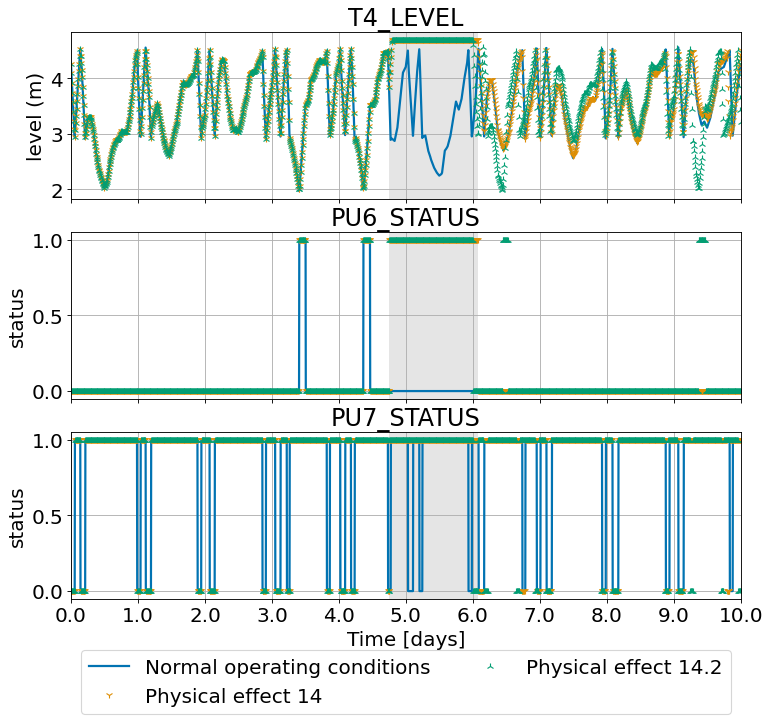

In [42]:
first_tanks = ['T4_LEVEL', 'PU6_STATUS', 'PU7_STATUS']
plot_attacks([normal_conditions, attack_14_no_concealment, attack_14_2_no_concealment], first_tanks, 
           ['Normal operating conditions', 'Physical effect 14', 'Physical effect 14.2'],  first_tanks, sub_filename = 'plots/14vs14_2physical', 
           y_label=['level (m)', 'status', 'status'], xlim = [0,2880], markers=run_markers,attack_begin_line=1368, attack_end_line=1750,
            dim1=27/2.5, dim2=23/2.5)

(array([   0.,  500., 1000., 1500., 2000., 2500., 3000.]), [Text(0.0, 0, '0'), Text(500.0, 0, '500'), Text(1000.0, 0, '1000'), Text(1500.0, 0, '1500'), Text(2000.0, 0, '2000'), Text(2500.0, 0, '2500'), Text(3000.0, 0, '3000')])


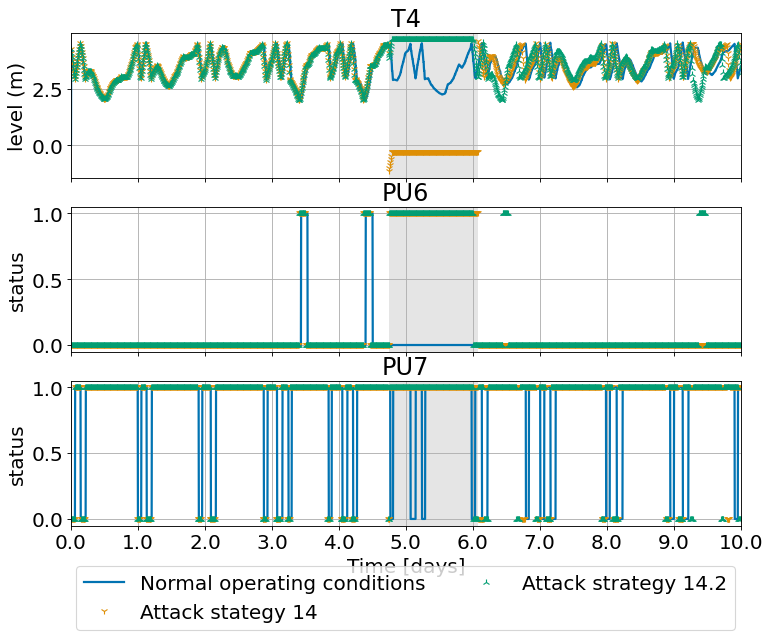

In [43]:
first_tanks = ['T4', 'PU6', 'PU7']
plot_attacks([normal_conditions_scada, attack_14_no_concealment_scada, attack_14_2_no_concealment_scada], first_tanks, 
           ['Normal operating conditions', 'Attack stategy 14', 'Attack strategy 14.2'],  first_tanks, sub_filename = 'plots/14vs14_2attack_strategy', 
           y_label=['level (m)', 'status', 'status'], xlim = [0,2880], markers=run_markers,attack_begin_line=1368, attack_end_line=1750,
            dim1=27/2.5, dim2=20/2.5)

# Anomalies 34-37 Ground Truth 

(array([   0.,  500., 1000., 1500., 2000., 2500., 3000.]), [Text(0.0, 0, '0'), Text(500.0, 0, '500'), Text(1000.0, 0, '1000'), Text(1500.0, 0, '1500'), Text(2000.0, 0, '2000'), Text(2500.0, 0, '2500'), Text(3000.0, 0, '3000')])


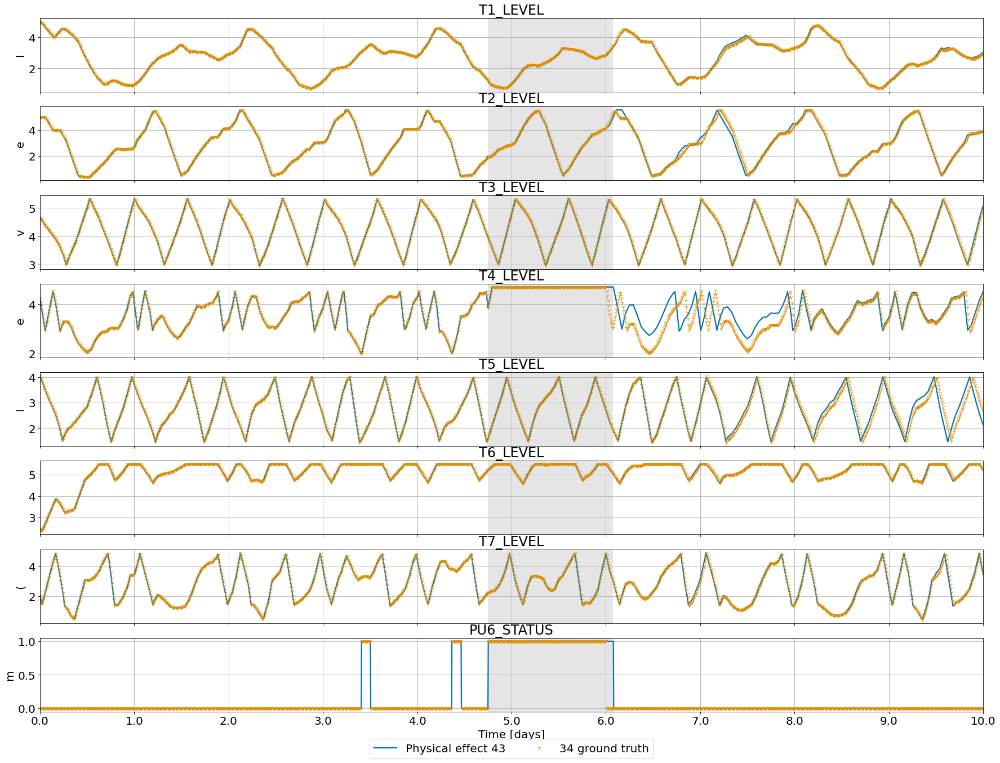

In [44]:
first_tanks = ['T1_LEVEL', 'T2_LEVEL', 'T3_LEVEL', 'T4_LEVEL', 'T5_LEVEL', 'T6_LEVEL', 'T7_LEVEL', 'PU6_STATUS']
plot_attacks([attack_14_no_concealment, attack_35], first_tanks, 
           ['Physical effect 43', '34 ground truth'],  first_tanks, sub_filename = 'batadal_20', 
           y_label='level (m)', xlim = [0,2880], markers=run_markers,attack_begin_line=1368, attack_end_line=1750)

(array([   0.,  500., 1000., 1500., 2000., 2500., 3000.]), [Text(0.0, 0, '0'), Text(500.0, 0, '500'), Text(1000.0, 0, '1000'), Text(1500.0, 0, '1500'), Text(2000.0, 0, '2000'), Text(2500.0, 0, '2500'), Text(3000.0, 0, '3000')])


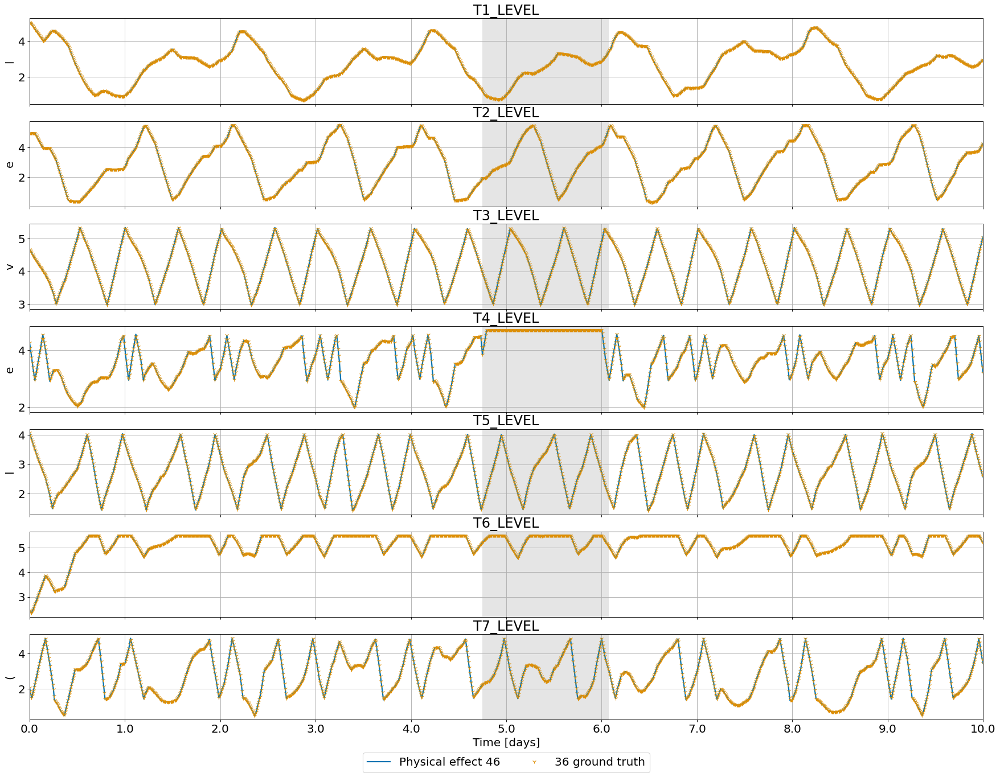

In [45]:
first_tanks = ['T1_LEVEL', 'T2_LEVEL', 'T3_LEVEL', 'T4_LEVEL', 'T5_LEVEL', 'T6_LEVEL', 'T7_LEVEL']
plot_attacks([attack_14_2_no_concealment, attack_36], first_tanks, 
           ['Physical effect 46', '36 ground truth'],  first_tanks, sub_filename = 'batadal_20', 
           y_label='level (m)', xlim = [0,2880], markers=run_markers,attack_begin_line=1368, attack_end_line=1750)

(array([   0.,  500., 1000., 1500., 2000., 2500., 3000.]), [Text(0.0, 0, '0'), Text(500.0, 0, '500'), Text(1000.0, 0, '1000'), Text(1500.0, 0, '1500'), Text(2000.0, 0, '2000'), Text(2500.0, 0, '2500'), Text(3000.0, 0, '3000')])


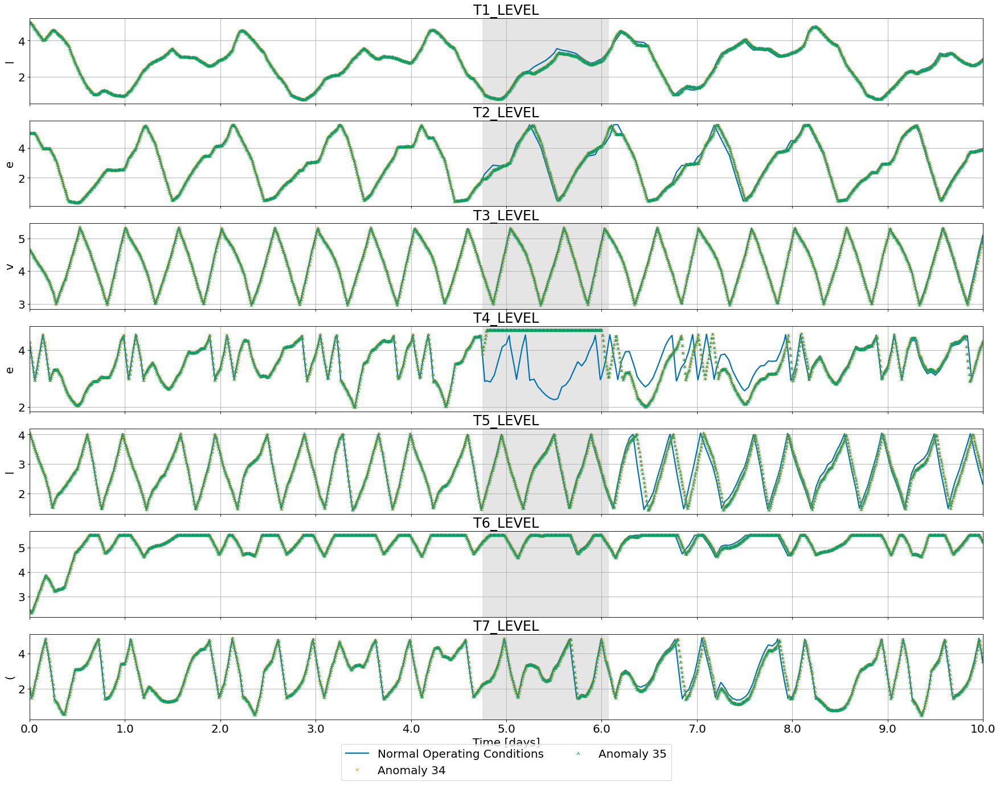

In [46]:
first_tanks = ['T1_LEVEL', 'T2_LEVEL', 'T3_LEVEL', 'T4_LEVEL', 'T5_LEVEL', 'T6_LEVEL', 'T7_LEVEL']
plot_attacks([normal_conditions, attack_34, attack_35], first_tanks, 
           ['Normal Operating Conditions', 
            'Anomaly 34',
            'Anomaly 35'],  first_tanks, sub_filename = 'batadal_20', 
           y_label='level (m)', xlim = [0,2880], markers=run_markers,attack_begin_line=1368, attack_end_line=1750)

(array([   0.,  500., 1000., 1500., 2000., 2500., 3000.]), [Text(0.0, 0, '0'), Text(500.0, 0, '500'), Text(1000.0, 0, '1000'), Text(1500.0, 0, '1500'), Text(2000.0, 0, '2000'), Text(2500.0, 0, '2500'), Text(3000.0, 0, '3000')])


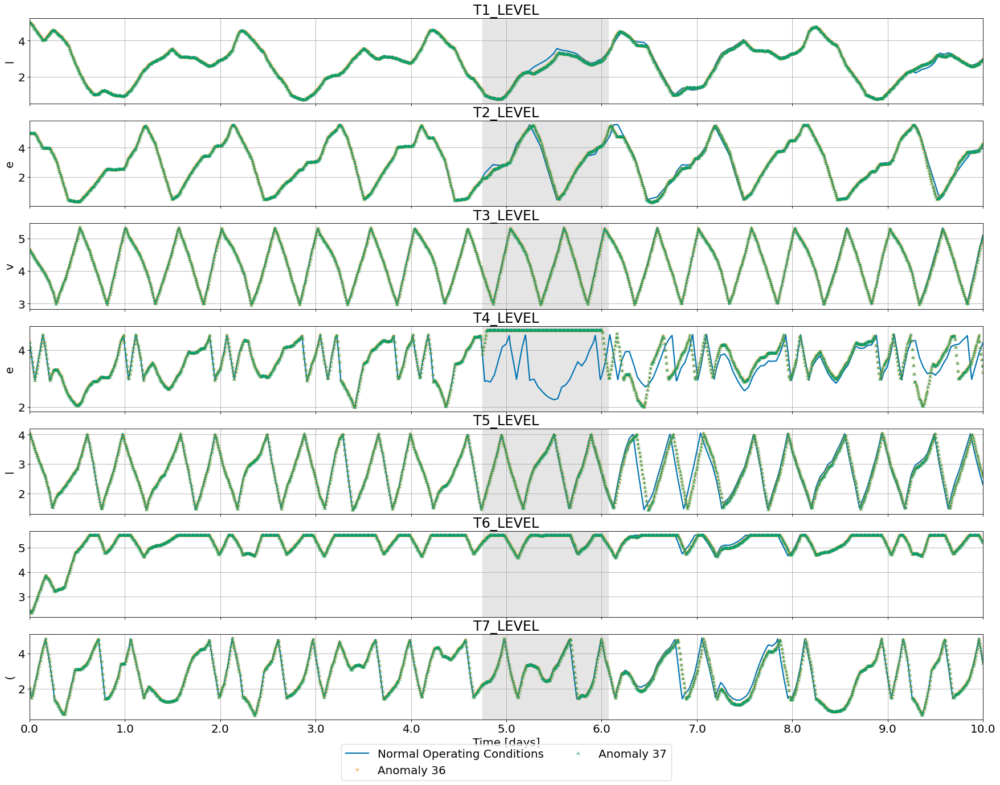

In [47]:
first_tanks = ['T1_LEVEL', 'T2_LEVEL', 'T3_LEVEL', 'T4_LEVEL', 'T5_LEVEL', 'T6_LEVEL', 'T7_LEVEL']
plot_attacks([normal_conditions, attack_36, attack_37], first_tanks, 
           ['Normal Operating Conditions', 
            'Anomaly 36',
            'Anomaly 37'],  first_tanks, sub_filename = 'batadal_20', 
           y_label='level (m)', xlim = [0,2880], markers=run_markers,attack_begin_line=1368, attack_end_line=1750)

# Anomalies 34-37 SCADA Values

(array([   0.,  500., 1000., 1500., 2000., 2500., 3000.]), [Text(0.0, 0, '0'), Text(500.0, 0, '500'), Text(1000.0, 0, '1000'), Text(1500.0, 0, '1500'), Text(2000.0, 0, '2000'), Text(2500.0, 0, '2500'), Text(3000.0, 0, '3000')])


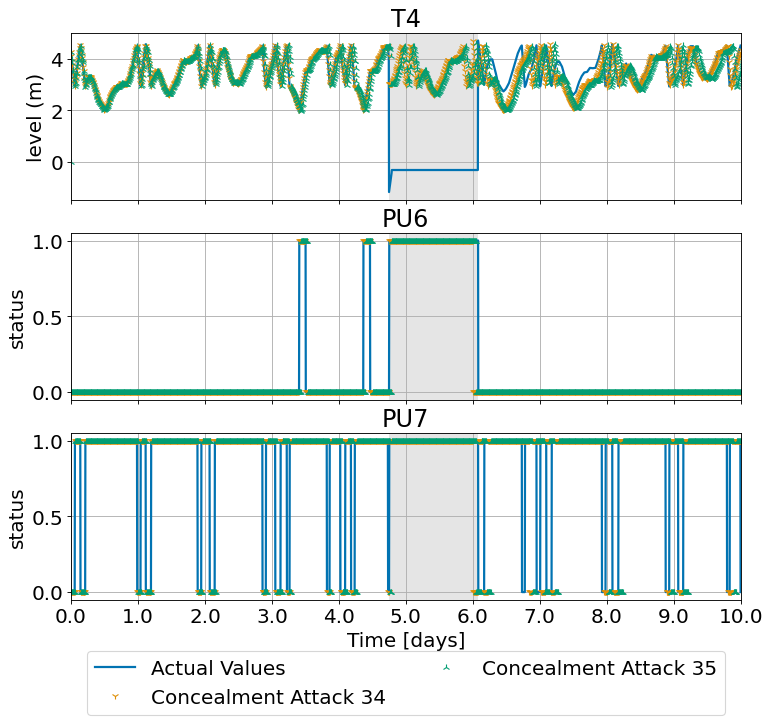

In [48]:
first_tanks = ['T4', 'PU6', 'PU7']
plot_attacks([attack_14_no_concealment_scada, attack_34_scada, attack_35_scada], first_tanks, 
           ['Actual Values', 
            'Concealment Attack 34',
            'Concealment Attack 35'],  first_tanks, sub_filename = 'plots/14vs34vs35scada', 
           y_label=['level (m)', 'status', 'status'], xlim = [0,2880], markers=run_markers,attack_begin_line=1368, attack_end_line=1750,
            dim1=27/2.5,dim2=23/2.5)

(array([   0.,  500., 1000., 1500., 2000., 2500., 3000.]), [Text(0.0, 0, '0'), Text(500.0, 0, '500'), Text(1000.0, 0, '1000'), Text(1500.0, 0, '1500'), Text(2000.0, 0, '2000'), Text(2500.0, 0, '2500'), Text(3000.0, 0, '3000')])


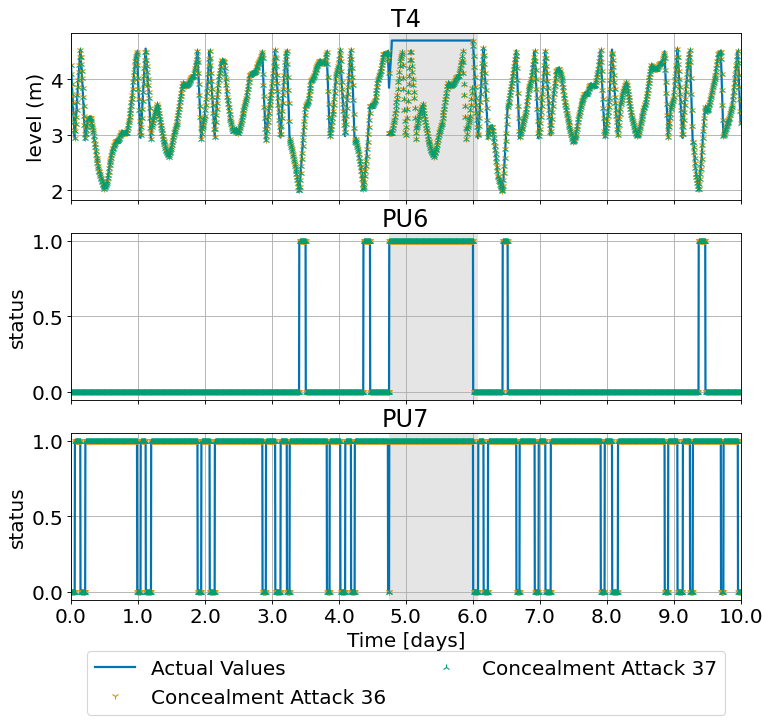

In [49]:
first_tanks = ['T4', 'PU6', 'PU7']
plot_attacks([attack_14_2_no_concealment_scada, attack_36_scada, attack_37_scada], first_tanks, 
           ['Actual Values', 
            'Concealment Attack 36',
            'Concealment Attack 37'],  first_tanks, sub_filename = 'plots/14_2vs36vs37scada', 
           y_label=['level (m)', 'status', 'status'], xlim = [0,2880], markers=run_markers,attack_begin_line=1368, attack_end_line=1750,
            dim1=27/2.5,dim2=23/2.5)